# Unsupervised Clustering Methods for Meteorological European Configurations/ Patterns


<span style="color: red;">- ORA MODIFICO IL MODO DI STANDARDIZZARE -> STANDARDIZZAZIONE GLOBALE così:</span>
- Preservati i rapporti relativi: z_250 resta sempre > z_500 > z_850
- Mantengo le distanze verticali: spessore della troposfera conservato
- Conservo la stagionalità: inverno vs estate mantengono le differenze assolute
- problemi numerici risolti: tutte le feature hanno scala simile per PCA/clustering

<span style="color: red;">- ds filtrato con z_500 + t_850 </span>


In [1]:
import xarray as xr
import numpy as np
import pandas as pd
#import gc
import matplotlib.pyplot as plt
import shapefile as shp
import warnings
warnings.filterwarnings('ignore')

import importlib
import utils.data_processing
import utils.visualization
importlib.reload(utils.data_processing)
importlib.reload(utils.visualization)

# Import the functions 
from utils.data_processing import prepare_data_matrix, apply_global_standardization, perform_incremental_pca

from utils.visualization import plot_variance, scatter_plot_2d,scatter_plot_3d,  add_country_boundaries
from utils.visualization import visualization_pca_coefficient

from utils.clusterization import kmeans, elbow_analysis, gap_statistic, silhouette_analysis, davies_bouldin_analysis

## 1 Data Loading and Initial Analysis

The dataset used in this analysis consists of ERA5 reanalysis data downloaded from the Copernicus Climate Data Store (CDS). ERA5 is the fifth generation ECMWF atmospheric reanalysis providing comprehensive meteorological data with high spatial and temporal resolution. The dataset covers a 5-year period from January 1, 2000 to December 31, 2004, focusing on the European region. It includes four key atmospheric variables: geopotential height (z), temperature (t), and horizontal wind components (u, v), measured at three pressure levels (850 hPa, 500 hPa, and 250 hPa) on a regular 0.25° × 0.25° grid. This high-resolution gridded data provides a comprehensive representation of European atmospheric patterns and will be used to identify meteorological configurations through unsupervised clustering methods.

    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts

In [2]:
# Load the dataset
ds = xr.open_dataset('era5_2000_2004.grib', engine= 'cfgrib') # XArray DataSet
print("Overview of the dataset:")
print(f"   • Variables: {list(ds.data_vars.keys())}")
print(f"   • Coordinates: {list(ds.coords.keys())}")

Overview of the dataset:
   • Variables: ['z', 't', 'u', 'v']
   • Coordinates: ['number', 'time', 'step', 'isobaricInhPa', 'latitude', 'longitude', 'valid_time']


**cfgrib** legge correttamente le coord spazio-temporali dai messaggi GRIB. Ogni dato è sempre associato alle sue coordinate (time, lat, lon, pressure). La dimensione 'time' preserva la sequenza cronologica. --> https://pypi.org/project/cfgrib/

In [3]:
# Dimenision details
print("Dimension details:")
if 'latitude' in ds.dims:
    print(f"   • Latitude: {ds.dims['latitude']} points ({ds.latitude.min().values:.1f}° - {ds.latitude.max().values:.1f}°)")
if 'longitude' in ds.dims:
    print(f"   • Longitude: {ds.dims['longitude']} points ({ds.longitude.min().values:.1f}° - {ds.longitude.max().values:.1f}°)")
if 'time' in ds.dims:
    print(f"   • Time: {ds.dims['time']} steps ({pd.to_datetime(ds.time.values[0]).strftime('%Y-%m-%d')} - {pd.to_datetime(ds.time.values[-1]).strftime('%Y-%m-%d')})")
if 'isobaricInhPa' in ds.dims:
    print(f"   • Pressure levels: {ds.dims['isobaricInhPa']} levels ({list(ds.isobaricInhPa.values)} hPa)")

#Variables 
print("Variables in the dataset:")
for var in ds.data_vars:
    var_data = ds[var]
    print(f"   • {var}: {var_data.dims} - {var_data.attrs.get('long_name', 'N/A')}")
    print(f"     └─ Units: {var_data.attrs.get('units', 'N/A')}")

Dimension details:
   • Latitude: 201 points (20.0° - 70.0°)
   • Longitude: 321 points (-40.0° - 40.0°)
   • Time: 1827 steps (2000-01-01 - 2004-12-31)
   • Pressure levels: 3 levels ([np.float64(850.0), np.float64(500.0), np.float64(250.0)] hPa)
Variables in the dataset:
   • z: ('time', 'isobaricInhPa', 'latitude', 'longitude') - Geopotential
     └─ Units: m**2 s**-2
   • t: ('time', 'isobaricInhPa', 'latitude', 'longitude') - Temperature
     └─ Units: K
   • u: ('time', 'isobaricInhPa', 'latitude', 'longitude') - U component of wind
     └─ Units: m s**-1
   • v: ('time', 'isobaricInhPa', 'latitude', 'longitude') - V component of wind
     └─ Units: m s**-1


In [4]:
# Total dimensionality
total_spatial_points = 1
for dim in ['latitude', 'longitude']:
    if dim in ds.dims:
        total_spatial_points *= ds.dims[dim]

total_features = len(ds.data_vars) * ds.dims.get('isobaricInhPa', 1) * total_spatial_points
print("DIMENSIONALITY:")
print(f" • Spatial points: {total_spatial_points}")
print(f" • Total features per timestep: {total_features:,}")
print(f" • Temporal samples: {ds.dims.get('time', 1)}")

DIMENSIONALITY:
 • Spatial points: 64521
 • Total features per timestep: 774,252
 • Temporal samples: 1827


In [5]:
# Missing values check: already verified to be 0
print("MISSING VALUES: No missing values (previously verified)")

MISSING VALUES: No missing values (previously verified)


There are no missing values in the dataset

## 2 Preprocessing and Feature Selection

### 2.1 Preparing Data Matrix

#### Initial data structure

Our dataset consists of geopotential height (z) measurements organized as a 4-dimensional array. The structure of this array is: a temporal dimension of 1827 daily observations from 1.01.2000 to 31.12.2004; a spatial dimension of 64521 points given by 201 latitude values x 321 longitude values and a vertical dimension given by the fact that the measurements are taken at 3 different atmospheric pressure levels ( 850 hPa, 500 hPa, 250 hPa).  
The data are organized in a nested structure where for each pressure level, measurements are recorded at every latitude-longitude grid point across the European region. 

_ _ _ - - _ _ _ (  
**Scatola** = Dataset   
dentro la scatola di sono dei blocchi di fogli  
**Un blocco di fogli** = un signolo giorno ( da 1 gennaio 2000 a 31 dic 2004)  -> <span style="color: red;">1827 giorni</span>  
il blocco di fogli è formato da 1 foglio   
**Un foglio contiene i valori di una variabile** =  variabile: z -> <span style="color: red;">1 variabile</span>  

Ogni foglio contiene i valori di quella variabile presi in ogni singolo punto dello 'spazio' definito dalla longitudine e dalla laitudine. Quindi in ogni foglio c'è il valore di quella variabile in ognuno dei 201(lat) × 321(lon). Una specie di tabella.  -> <span style="color: red;">64521 punti spaziali</span>

**Solo che questa tabella di valori è presa per ognuno dei 3 livelli di pressione** = 850 hPa, 500 hPa, 250 hPa -> <span style="color: red;">3 lv di pressione</span>

**TOT= 193,563 valori per blocco**   x 1827 giorni

Per la variabile z: 
__per ogni livello di pressione:  
____per ogni lat:  
______per ogni lon:  
________prendi il valore  

Se penso al foglio come una tabella con 193,563 colonne, e solo 1 riga, che rappresenta tutte le misure spaziali per quel giorno, posso mettere insieme tutti i 1827 fogli, e ottenere una matrice finale di forma (1827, 193,563). Ogni riga è un giorno. Ogni colonna è una variabile a una certa posizione e pressione.  
_ _ _ - - _ _ _ )


#### Final data structure

For our following analysis we need to reshape this multimensional matrix into a 2D matrix. The temporal dimension will remain the same, each column, instead, will become a combination of the geopotential height at a specific spatial location (latitude-longitude pair) and pressure level.

           feature_1  feature_2  ...  feature_193,563 
time_1 →      ...        ...             ...  
time_2 →      ...        ...             ...  
  ⋮                             
time_1827 →   ...        ...             ...  


print("PREPARING DATA MATRIX")
X, data_matrices = prepare_data_matrix(ds)
print(f"Data Matrix: {X.shape} (samples, features)")

In [6]:
# demarcare la cella di prima se torno ai dati di prima (cella per selezionare le variabili)
# nel caricamento dati devo mettere il file 'era5_2000_2004.grib'
# - Geopotenziale a 500 hPa
# - Temperatura a 850 hPa

# Create a new dataset
ds_filtered = xr.Dataset()

# Add the geopotential at 500 hPa
z_500 = ds['z'].sel(isobaricInhPa=[500])

# Add the temperature at 850 hPa
t_850 = ds['t'].sel(isobaricInhPa=[850])

# Rename the coordinates in order to avoid conflicts
z_500 = z_500.rename({'isobaricInhPa': 'pressure_z'})
t_850 = t_850.rename({'isobaricInhPa': 'pressure_t'})


# Combine everything into the filtered dataset
ds_filtered = xr.Dataset({
    'z': z_500,
    't': t_850
})

print(f"Filtered Dataset - Variables: {list(ds_filtered.data_vars.keys())}")
print(f"Dimensions: {dict(ds_filtered.dims)}")

print(ds_filtered)  

print("-----------------")
X, data_matrices = prepare_data_matrix(ds_filtered)




Filtered Dataset - Variables: ['z', 't']
Dimensions: {'time': 1827, 'pressure_z': 1, 'latitude': 201, 'longitude': 321, 'pressure_t': 1}
<xarray.Dataset> Size: 943MB
Dimensions:     (time: 1827, pressure_z: 1, latitude: 201, longitude: 321,
                 pressure_t: 1)
Coordinates:
    number      int64 8B 0
  * time        (time) datetime64[ns] 15kB 2000-01-01 2000-01-02 ... 2004-12-31
    step        timedelta64[ns] 8B 00:00:00
  * pressure_z  (pressure_z) float64 8B 500.0
  * latitude    (latitude) float64 2kB 70.0 69.75 69.5 69.25 ... 20.5 20.25 20.0
  * longitude   (longitude) float64 3kB -40.0 -39.75 -39.5 ... 39.5 39.75 40.0
    valid_time  (time) datetime64[ns] 15kB 2000-01-01 2000-01-02 ... 2004-12-31
  * pressure_t  (pressure_t) float64 8B 850.0
Data variables:
    z           (time, pressure_z, latitude, longitude) float32 472MB ...
    t           (time, pressure_t, latitude, longitude) float32 472MB ...
-----------------
Processing z...
     → z: ('time', 'pressure_z', 

### 2.2 Standardization

For the standardization process, we initially implemented a per-feature standardization approach, where each spatial point was normalized with respect to its local temporal variability. However, this approach presents a significant limitation: all physical relationships between pressure levels (z₂₅₀ > z₅₀₀ > z₈₅₀) are lost, and the vertical structure of the troposphere becomes distorted.

To address this issue, we adopted a global standardization approach. This method preserves the relative relationships between pressure levels and maintains the atmospheric depth structure. Additionally, it ensures that all features have comparable scales, which is essential for subsequent analyses such as PCA and clustering, while retaining the meteorological interpretability of the data.

In [7]:
print("GLOBAL STANDARDIZATION")

# Applica standardizzazione globale usando la funzione da utils
X, global_mean, global_std = apply_global_standardization(X)

print("Before standardization:")
print(f" • Global mean: {global_mean:.2f}m")
print(f" • Global std: {global_std:.2f}m")
print(f"Dataset shape: {X.shape}")

print("After standardization:")
print(f" • New global mean: {X.mean():.6f}")
print(f" • New global std: {X.std():.6f}")

# Verify some sample statistics
print(f" • Sample min: {X.min():.3f}")
print(f" • Sample max: {X.max():.3f}")

GLOBAL STANDARDIZATION
Before standardization:
 • Global mean: 27772.10m
 • Global std: 27533.99m
Dataset shape: (1827, 129042)
After standardization:
 • New global mean: 0.000049
 • New global std: 1.000013
 • Sample min: -1.000
 • Sample max: 1.131


Now, an esample of standardization for 3 points is shown.

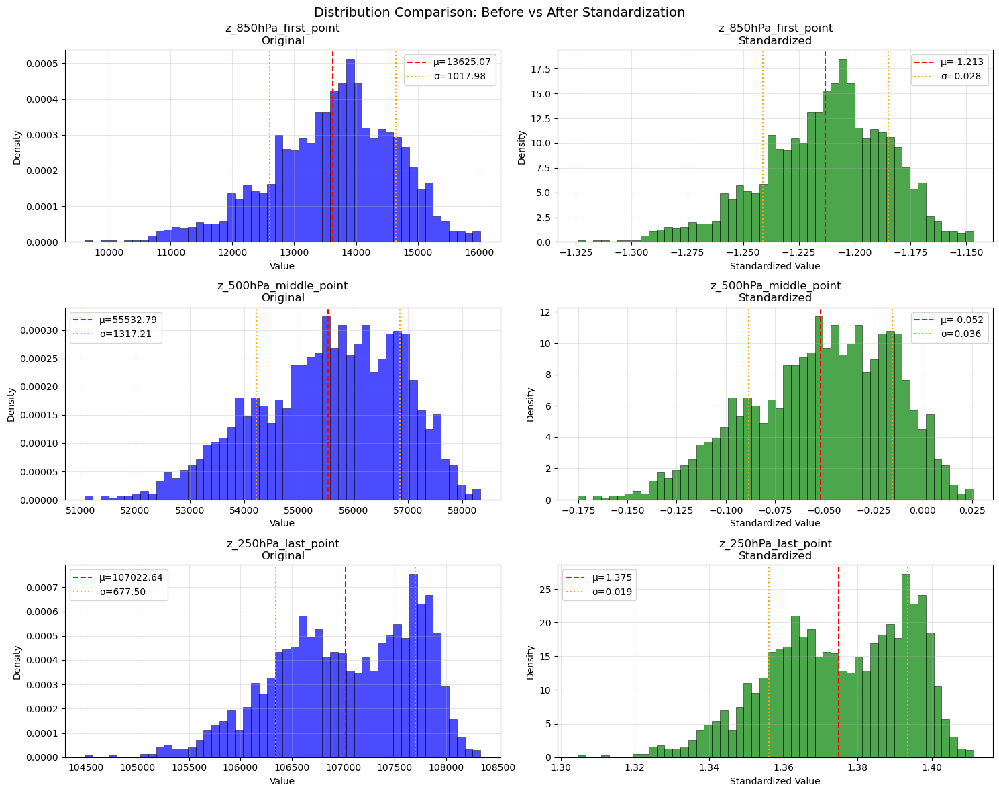

### 2.3 Principal Component Analysis

For the Principal Component Analysis, we implemented an incremental PCA approach to avoid potential memory and numerical issues when dealing with large datasets. The incremental PCA processes data in batches while maintaining mathematical equivalence to standard PCA, ensuring convergence to identical results.

The primary objective of PCA is to represent the dataset in a lower-dimensional space using a reduced number of variables (principal components) while preserving as much variance (information) as possible from the original data. This dimensionality reduction technique enables us to capture the most significant patterns of atmospheric variability while reducing computational complexity for subsequent clustering analysis.



**Varianza = quanto i dati si "spargono" attorno alla media**
- La PCA cerca le **direzioni di MASSIMA varianza**   
- Trova i pattern meteorologici che cambiano di più nel tempo  
- Cattura le configurazioni atmosferiche principali (NAO, anticicloni, ecc.)  

<span style="color: orange;"> La PCA non assegna etichette o categorie: ogni campione rimane un punto nello spazio, solo rappresentato in modo più efficiente. Le componenti non sono cluster, ma assi cartesiani scelti in modo che la varianza sia massima lungo il primo asse, poi il secondo ecc. Quindi la PCA non è un clustering, anche se può rivelare struttura nei dati.

Principal components are a sequence of projections of the data, mutually uncorrelated and ordered in variance.   
The principal components of a set of data in IRp provide a sequence of best
linear approximations to that data, of all ranks q ≤ p.  
(BookAdvanced, pg 553)

In [8]:
print("INCREMENTAL PCA ANALYSIS")

n_components = 20  # Reduced to 20 components for safety with batch processing
batch_size = 100    # Increased batch size to accommodate more components

print(f"   • Target components: {n_components}")
print(f"   • Batch size: {batch_size}")
 
X_pca, ipca, explained_variance_ratio, cumulative_variance = perform_incremental_pca(X, n_components=n_components, batch_size=batch_size)

INCREMENTAL PCA ANALYSIS
   • Target components: 20
   • Batch size: 100
Original shape: (1827, 129042)
PCA shape: (1827, 20)

First 10 components variance: [0.48856695 0.11829745 0.0932101  0.07293113 0.05365241 0.03333664
 0.02225061 0.02025625 0.01486576 0.01063322]
Total explained variance 20 components cumulative: 0.975


Il grafico mostra chiaramente un forte “elbow” nei primi componenti: la prima componente da sola spiega il 54.2% (!), la seconda il 9.9%, e poi via via la varianza scende rapidamente → significa che gran parte dell’informazione è concentrata nei primi componenti

VARIANCE VISUALIZATION


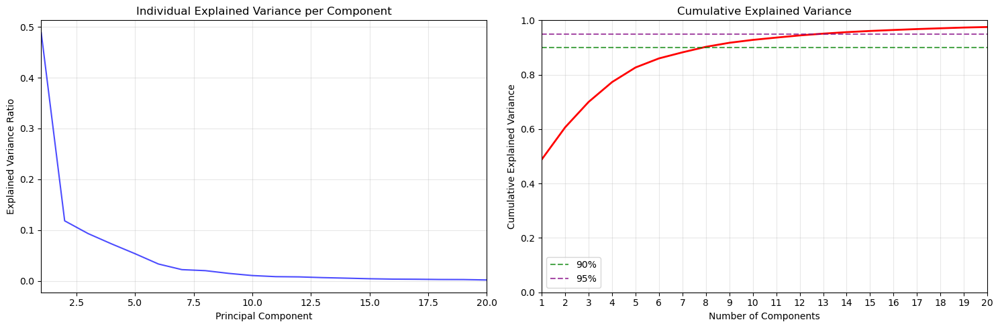

In [9]:
# Visualization of explained variance
print("VARIANCE VISUALIZATION")

# Create plots for variance analysis

plot_variance(explained_variance_ratio, cumulative_variance, n_components)


grafico a sinistra: varianza spiegata per singola componente
(di solito decresce velocemente, “elbow” shape)  
mostra la varianza spiegata da ciascun componente  
conferma che la prima componente è molto informativa  
curva a gomito → tipico nei dati ridondanti

grafico a destra: varianza spiegata cumulata
(sale a gradini, fino a saturare verso 1)  
mostra la varianza cumulata
le linee orizzontali (80%, 90%, 95%)   
la curva rossa sale rapidamente ma si stabilizza, quindi i componenti successivi hanno impatto minore

<span style="color: orange;">la PCA permette di proiettare i dati in un nuovo spazio ridotto che mantiene la maggior parte dell’informazione
Inoltre, facilita interpretazioni fisiche (ad esempio i primi componenti possono corrispondere a pattern meteorologici dominanti) e riduce il rumore e la ridondanza tra variabili. Sceòlgo 20 compon. princ. perchè comunque arrivo al 97.5% di varianza spiegata che è molto buono ed eveito di prendere più componenti principali perchè così non introduco rumore that can affect the clusterization.</span>

In [10]:
n_components_final = 20  # Final number of components based on variance analysis
print(f"Original data shape: {X.shape}")
print(f"PCA shape: {X_pca.shape}")

variance_explained = cumulative_variance[n_components_final-1]
print(f"Variance explained: {variance_explained:.3f} ({variance_explained*100:.1f}%)")


Original data shape: (1827, 129042)
PCA shape: (1827, 20)
Variance explained: 0.975 (97.5%)


#### 2.3.1 Visualization of the first components

I plots 2D/3D servono per:

- PC1 vs PC2: scatter plot per vedere se ci sono cluster naturali
- PC1 vs PC2 vs PC3: scatter 3D per pattern più complessi
- Istogrammi delle prime 4-5 componenti  
Se vedo "nuvole" separate → suggerisce struttura a cluster

VISUALIZATION OF PRINCIPAL COMPONENTS


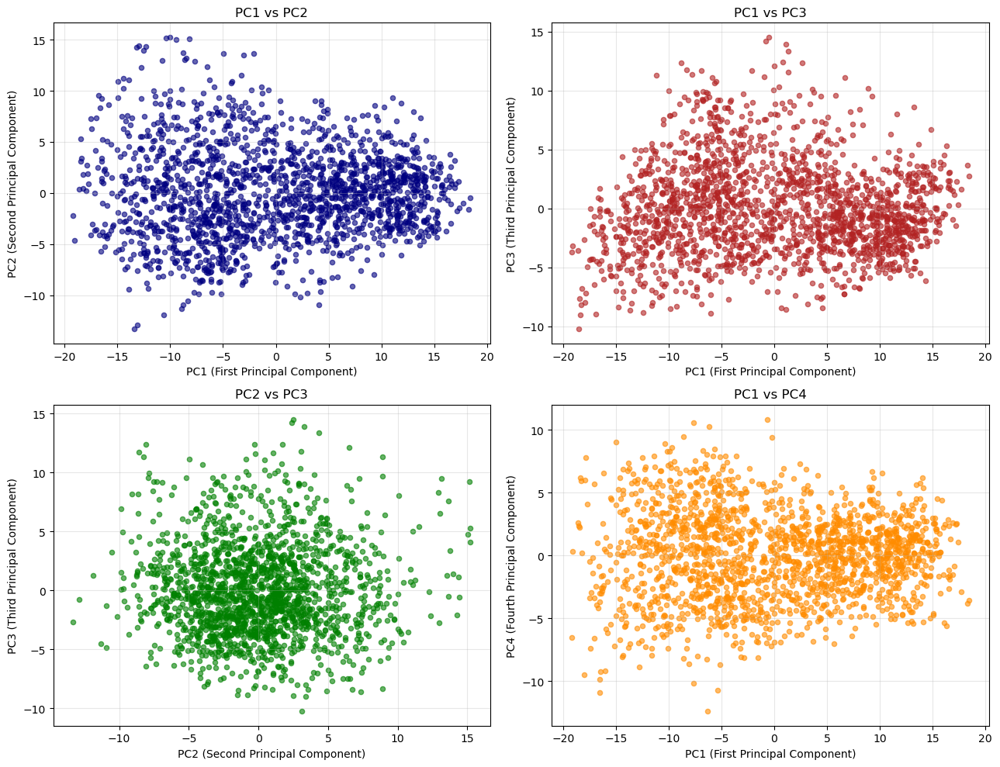

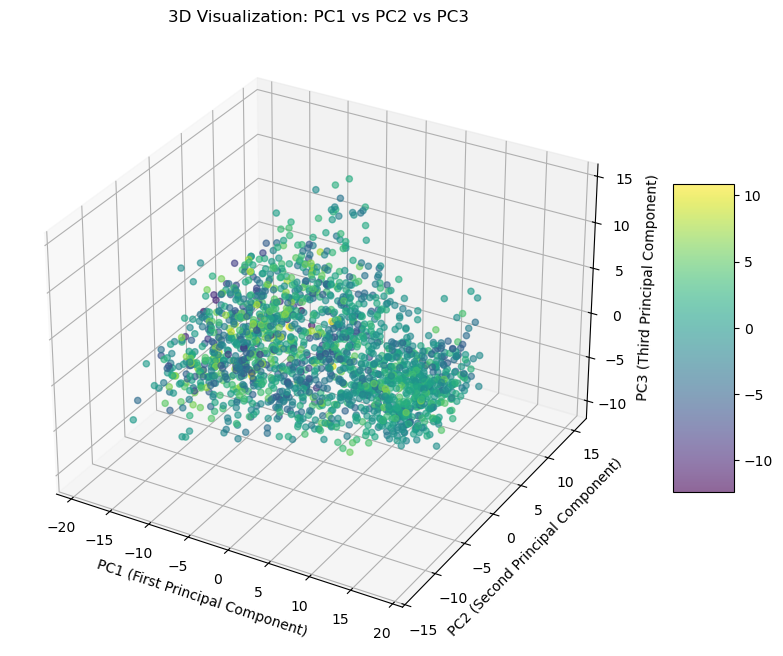

In [11]:
print("VISUALIZATION OF PRINCIPAL COMPONENTS")

# 1. SCATTER PLOT 2D: PC1 vs PC2
scatter_plot_2d(X_pca)

# 2. SCATTER PLOT 3D: PC1 vs PC2 vs PC3
scatter_plot_3d(X_pca)


<span style="color: skyblue;">Capire cosa rappresentano i puntini</span> --> La posizione del puntino è determinata dalle sue coordinate proiettate su due componenti principali.

**PC1 vs PC2**: Two distinct clusters are clearly visible, indicating good separation between different meteorological configurations. PC1 appears to capture a primary discriminant direction that effectively separates the data into distinct atmospheric patterns. This suggests that PC1 represents the most significant mode of variability in European weather patterns, potentially corresponding to major synoptic-scale phenomena.

**PC2 vs PC3 and PC1 vs PC3**: The separation between clusters is less pronounced in these projections. PC3 captures more dispersed variance, suggesting it represents secondary meteorological patterns that are more spatially or temporally distributed. The weaker clustering indicates that PC3 may correspond to regional-scale variations or transitional weather states.

**PC1 vs PC4**: PC4 shows minimal evident structure and appears to contain less discriminative information. This component likely represents either background noise or minor meteorological variations that contribute less to the overall atmospheric configuration patterns.


# 3. HISTOGRAMS of first 5 components
fig, axes = plt.subplots(2, 3, figsize=(15, 7))
axes = axes.flatten()

for i in range(5):
    axes[i].hist(X_pca[:, i], bins=30, alpha=0.7, color=f'C{i}', edgecolor='black')
    axes[i].set_xlabel(f'PC{i+1} Values')
    axes[i].set_ylabel('Frequency')
    axes[i].set_title(f'Distribution of PC{i+1}')
    axes[i].grid(True, alpha=0.3)
    
    # Add statistics
    mean_val = X_pca[:, i].mean()
    std_val = X_pca[:, i].std()
    axes[i].axvline(mean_val, color='red', linestyle='--', 
                   label=f'Mean: {mean_val:.2f}')
    axes[i].axvline(mean_val + std_val, color='orange', linestyle='--', alpha=0.7)
    axes[i].axvline(mean_val - std_val, color='orange', linestyle='--', alpha=0.7)
    axes[i].legend()

axes[5].remove()

plt.tight_layout()
plt.show()

# 4. SUMMARY STATISTICS
print("\n   • SUMMARY STATISTICS FOR FIRST 5 COMPONENTS:")
for i in range(5):
    pc_data = X_pca[:, i]
    print(f"   • PC{i+1}: Mean={pc_data.mean():.3f}, Std={pc_data.std():.3f}, "
          f"Min={pc_data.min():.3f}, Max={pc_data.max():.3f}")


**PC2, PC3, PC4, PC5** → Normal distributions centered at 0, as expected in normalized PCA. These components show typical Gaussian-like behavior with:
- Mean ≈ 0 
- Symmetric, bell-shaped distributions
- Standard deviations around 1, indicating proper normalization

**PC1** → **Bimodal distribution**   
The bimodal pattern indicates that PC1 effectively separates the data into **two distinct groups**. This suggests:
- Two dominant meteorological regimes in European weather patterns
- PC1 captures the primary mode of atmospheric variability that distinguishes between these regimes
- Strong evidence for natural clustering structure in the data

In [22]:
sf = shp.Reader("world/world-administrative-boundaries.shp")
# Get dimensions from original dataset (ds), not from X_pca which is a numpy array
n_lat = ds.dims['latitude'] if 'latitude' in ds.dims else len(ds.latitude)
n_lon = ds.dims['longitude'] if 'longitude' in ds.dims else len(ds.longitude)
n_pressure = ds.dims['isobaricInhPa'] if 'isobaricInhPa' in ds.dims else len(ds.isobaricInhPa)

lats = ds.latitude.values
lons = ds.longitude.values
pressure_levels = ds.isobaricInhPa.values.tolist()

_ _ _ - - _ _ _ - - _ _ _ 

We chose **not to weight the principal components** by their explained variance for the clustering analysis. While PC1 dominates with 54.2% of the variance compared to PC2 (9.9%) and PC3 (8.3%), weighting schemes significantly compromise the clustering quality. Linear weighting causes PC1 to dominate 97.5% of the clustering influence, effectively reducing the problem to a unidimensional analysis and eliminating the contribution of meteorologically meaningful secondary patterns.   
Even moderate $\sqrt{variance}$ weighting biases the clustering toward PC1 (84% influence) while drastically reducing the impact of PC2 and PC3. In contrast, unweighted components maintain a balanced contribution, preserving the multidimensional structure of atmospheric variability.   
This approach is particularly important for meteorological applications where secondary components often capture crucial regional patterns, seasonal variations, or synoptic-scale features that, despite explaining less variance globally, are essential for identifying distinct weather regimes. 

## 3 Clusterization


Now that we have analyzed the data, we have performed Principal Component Analysis (PCA) in order to reduce the dimensionality of the dataset and to highlight the most relevant features and components.
The next step is to implement an algorithm to cluster the data. The first method we will apply is the k-means algorithm.

_pg 28 articolo 2-the classification of atmosphere .._

### 3.1 K-means Implementation

The k-means algorithm allows us to divide the dataset into k groups (k is given, and we will perform an analysis later to determine the best value, as this is a key point). The association of each element in the dataset to a specific group is based on its attributes.

_it is a top-down procedure_

The goal of the algorithm is to minimize the total variance between different groups. Each group is identified through a centroid, note that they are not, in general, points from the dataset although they live in the same space.

Iteratively, the algorithm creates k partitions and assigns the incoming points to the groups. Then, it computes the centroids of each cluster and reassigns each point to the nearest centroid, using the Euclidean distance or another metric. The new centroids are then computed again, and the process continues until the method converges.

<span style="color: orange;">The MiniBatchKMeans is a variant of the KMeans algorithm which uses mini-batches to reduce the computation time, while still attempting to optimise the same objective function. </span>

_per me_  
**INIZIALIZZAZIONE**: k-means++’ : selects initial cluster centroids using sampling based on an empirical probability distribution of the points’ contribution to the overall inertia. This technique speeds up convergence. The algorithm implemented is “greedy k-means++”. It differs from the vanilla k-means++ by making several trials at each sampling step and choosing the best centroid among them.  
‘random’: choose n_clusters observations (rows) at random from data for the initial centroids.
If an array is passed, it should be of shape (n_clusters, n_features) and gives the initial centers.  
If a callable is passed, it should take arguments X, n_clusters and a random state and return an initialization.  

**N_INIT** : Number of times the k-means algorithm is run with different centroid seeds. The final results is the best output of n_init consecutive runs in terms of inertia. Several runs are recommended for sparse high-dimensional problems

-  -  

Perché k-means++ è preferibile:

    Sceglie il primo centro a caso, poi ogni centro successivo è scelto con probabilità proporzionale alla distanza al quadrato dal centro più vicino → evita centri troppo vicini fra loro.  
    Riduce la probabilità di convergere a soluzioni pessime.  
    Richiede poco overhead computazionale rispetto a una scelta casuale pura.

_fit(X, y=None, sample_weight=None)_ --> computes k-means clustering. ----  _returns:_ Fitted estimator.

_fit_predict(X, y=None, sample_weight=None)_ --> Compute cluster centers and predict cluster index for each sample. --- _returns:_ Index of the cluster each sample belongs to.

_predict(X)_ --> Predict the closest cluster each sample in X belongs to. ---  _returns:_ Index of the cluster each sample belongs to.

_transform(X)_ --> Transform X to a cluster-distance space. In the new space, each dimension is the distance to the cluster centers. Note that even if X is sparse, the array returned by transform will typically be dense --- _returns:_ X transformed in the new space.

<span style="color: orange;">2. Limiti pratici statistici:  </span>  
Regola del √n:  
Dove n = numero di osservazioni nei  dati PCA

In [13]:
K_range = range(2,31)  

# Perform kmeans
results = kmeans(X_pca, K_range=K_range, n_init=20)

#### 3.1.1 Evaluation of the best number of clusters (k)

_PER SELEZIONARE IL NUMERO DI CLUSTERS_ -->  https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py  

. curva a gomito  
. pg.519 - BookAdvanced

_ _ _ - - _ _ _ 

Idea intuitiva: se ci sono davvero K* gruppi naturali, aumentando K da 1 fino a K* ogni incremento separa veri gruppi e provoca una grande riduzione di WKWK​. Per K>K* ogni ulteriore cluster tende a spezzare gruppi già omogenei → riduzioni piccole. Quindi il grafico K vs W_k_ha una curva decrescente con un kink (gomito) approssimativamente a K*

WK(inertia)​ è la somma delle varianze interne (o somme di distanze quadratiche) di tutti i cluster.

WK​ è proprio la misura totale di “quanto sono vicini” i punti ai loro centri di cluster.

    Se i punti sono molto vicini al centro → W_k​ sarà piccolo (buon clustering).

    Se i punti sono sparsi → W_k_sarà grande.

Quando aumenti K (cioè il numero di cluster), i punti possono essere raggruppati in insiemi più piccoli e più vicini ai loro centri → WKWK​ tende sempre a diminuire

_ _ _ - - _ _ _ - - _ _ _




##### ELBOW _ _ _ - - _ _ _

The elbow is the most far away point from the line that links the first to the last point --> È il punto di massima curvatura geometrica

inerzia: Inerzia = Σ(i=1 to k) Σ(x∈Ci) ||x - μi||²  
k = numero di cluster  
Ci = cluster i-esimo  
x = punto dati  
μi = centroide del cluster i  
||x - μi||² = distanza euclidea al quadrato  

Inerzia = somma delle distanze al quadrato di tutti i punti dai loro centroidi  
Alta inerzia = punti sparsi, cluster "larghi" e poco compatti  
Bassa inerzia = punti vicini ai centroidi, cluster compatti  

Se l'inzerzia cala: I cluster diventano più compatti internamente. I punti sono più vicini ai loro centroidi, La variabilità interna dei cluster diminuisce, Il clustering è più preciso.

##### PERCENTAGE REDUCTION   _ _ _ - - _ _ _
Riduzione% = (Inerzia[k-1] - Inerzia[k]) / Inerzia[k-1] × 100  
mi dice: Quanto beneficio ottengo aggiungendo un cluster in più e l'efficacia marginale di ogni nuovo cluster

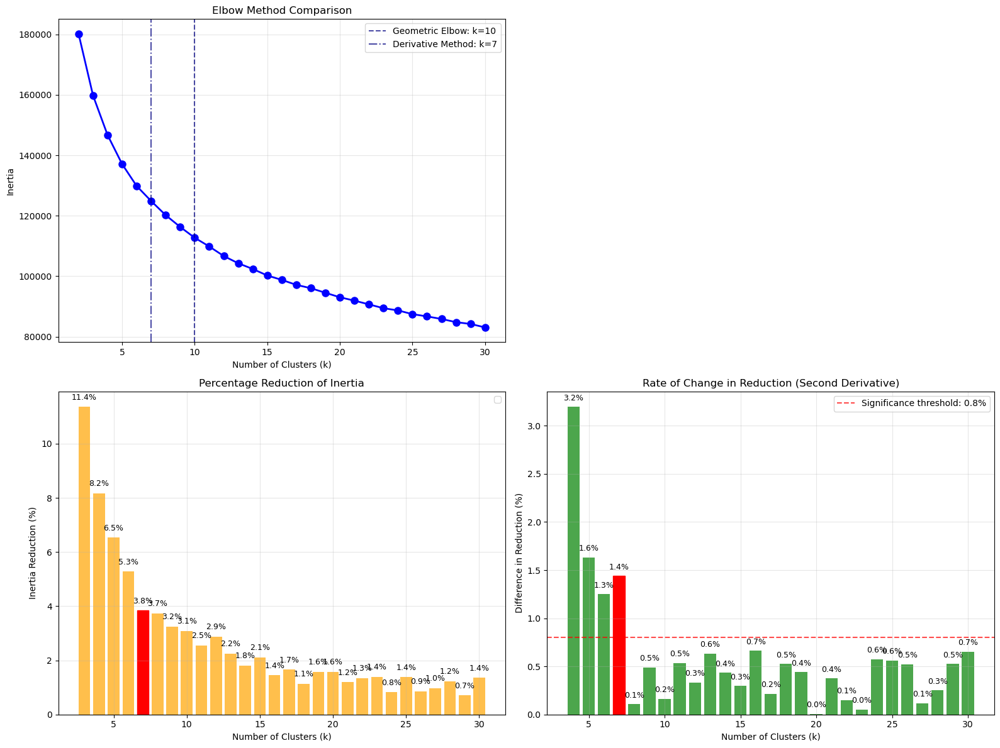

Elbow method suggests k = 10
Derivative method suggests k = 7


In [14]:
# ELBOW METHOD WITH PERCENTAGE REDUCTION

# Perform elbow analysis
k_elbow, k_derivative, reductions, _ = elbow_analysis(results) 
print(f"Elbow method suggests k = {k_elbow}")
print(f"Derivative method suggests k = {k_derivative}")


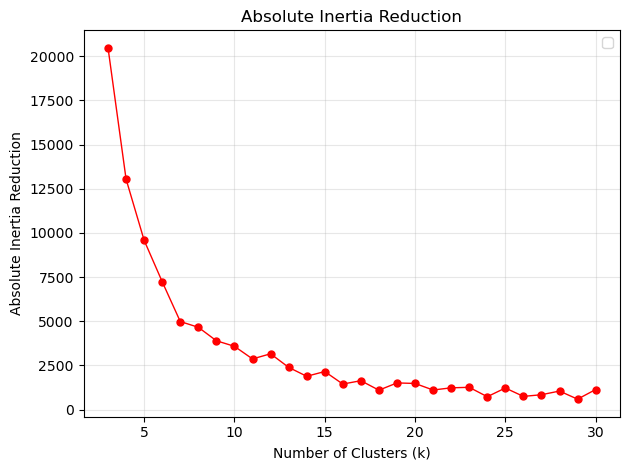

In [15]:
#### prova per vedere la differenza assoluta dell'inerzia vs k
def plot_absolute_inertia_reduction(results):
    """
    Visualizza la riduzione ASSOLUTA dell'inerzia
    """

    # Estraggo dati dai risultati
    K_range = results["K_range"]
    inertias = results["inertia"] 
    
    # Calcola le differenze ASSOLUTE
    absolute_reductions = []
    for i in range(1, len(inertias)):
        absolute_diff = inertias[i-1] - inertias[i]  # Quanto si riduce in valore assoluto
        absolute_reductions.append(absolute_diff)

    # Plot 1: DIFFERENZE ASSOLUTE 
    k_reductions = list(K_range)[1:]  # k da 3 in poi (perché confronto k vs k-1)

    plt.plot(k_reductions, absolute_reductions, 'ro-', linewidth=1, markersize=5)
    plt.xlabel('Number of Clusters (k)')
    plt.ylabel('Absolute Inertia Reduction')
    plt.title('Absolute Inertia Reduction')
    plt.grid(True, alpha=0.3)
    plt.legend()

    plt.tight_layout()
    plt.show()

# Use
plot_absolute_inertia_reduction(results)

The approach used by the elbow method is a geometric one, and it automatically detects the best number of clusters(k) by finding the point with the maximum distance from the line that links the first and the last point of the inertia curve. The result of the elbow method for our metereological dataset is k= 6. However, the insertia reduction curve apperas relatively smooth, because of the fact that atmospheric data contains weather patterns that transist gradually rather than with discontinuities. Applying a percentage reduction treshold provides more information: with a 10% treshold, k= 3-4 wuold be optimal; with a 5% treshold, k = 5-6, and with a 3% treshold teh range extends to k= 7-9. The smoothness of the curve shows us that the geometric elbow point remains stable regardless of the percentage treshold chosen.   
For our purpose the range k= 7-9 is a reasonable ecploration space, where each additional cluster captures gradually more detailed atmospheric patterns while maintaining statistical significance above the 3% improvement treshold.

_ _ _ - - _ _ _

GAP STATISTICS _ _ _ - -  _ _ _ 

"I cluster che vedo nei miei dati sono reali o potrebbero essere solo casuali?"

The Gap Statistic compares the within-cluster dispersion of your real data against what you would expect from random uniform data. If your data has natural clusters, the real data should be much more "clustered" (lower inertia) than random data.  _Se i tuoi dati hanno cluster reali, il K-means dovrebbe funzionare molto meglio sui dati reali che su quelli casuali
Se i tuoi dati non hanno cluster, K-means dovrebbe funzionare ugualmente male su entrambi_

To get the optimal number of clusters in a dataset, we use Gap Statistics. It compares the performance of clustering algorithms against a null reference distribution of the data, allowing for a more objective decision on the number of clusters.

Gap Statistic compares how well the clusters formed from your actual data stand out against what you would expect if the data were randomly distributed. In other words, it looks at how tightly packed your real clusters are compared to clusters created from random data. This helps us understand if the patterns we see in our data are meaningful or just due to chance

**Clustering the Data**: Perform clustering on the actual data using a clustering algorithm, such as k-means, for a range of potential cluster numbers (k).  
**Create Reference Data**: Generate a set of reference datasets by simulating random data with the same distribution and dimensionality as the original dataset. These datasets are assumed to contain no inherent structure (i.e., they are uniformly distributed).  
**Compute Clustering Performance**: For both the actual data and the reference datasets, compute the clustering performance using a cost function, typically the within-cluster sum of squared errors (WSS), also known as inertia in k-means clustering. This measures the compactness of clusters, where lower values indicate better clustering.  
**Gap Statistic Calculation**: The Gap Statistic for each number of clusters k is computed as: $$Gap(k)=1/B ∑_{b=1} ^{B}W_k^b−W_k$$  
Where:

    Wk is the WSS for the actual data with k clusters.
    Wkb​​ is the WSS for the reference data with k clusters.
    B is the number of reference datasets used.

**Selecting the Optimal Number of Clusters**: The optimal number of clusters is chosen as the smallest value of k such that: $$Gap(k)≥Gap(k+1)−SE(k+1)$$
Where SE(k+1) is the standard error of the Gap Statistic for k+1 clusters.
This condition ensures that the chosen k provides a significant improvement over the random configuration of data

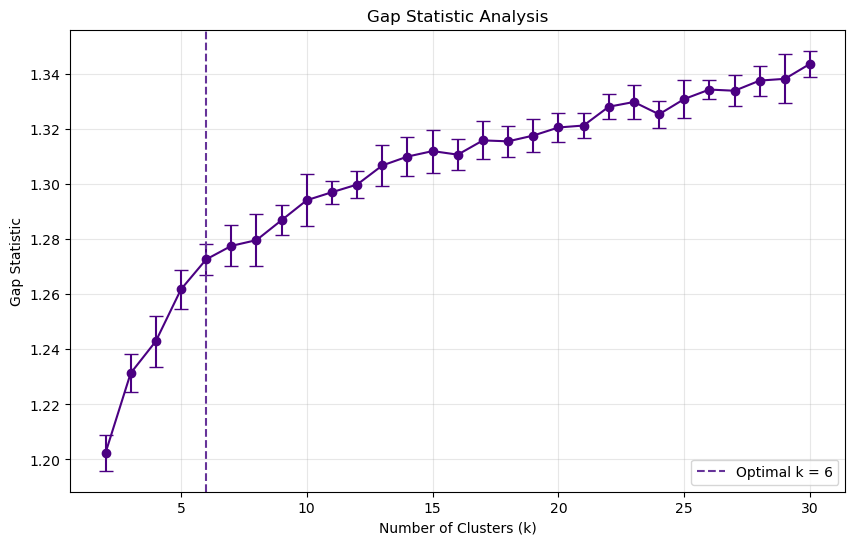

Optimal number of clusters: k = 6


In [16]:
# GAP STATISTIC ANALYSIS

# Run the analysis 
k_optimal, gap_values, error_values = gap_statistic(X_pca, results["K_range"], results)
print(f"Optimal number of clusters: k = {k_optimal}")

k=2: Gap = 1.180 (low - too simple)  
k=3: Gap = 1.221 (rising)  
k=4: Gap = 1.235 (still rising)  
k=5: Gap = 1.257 (PEAK IDENTIFIED)  
k=6: Gap = 1.261 (slightly higher)  
k=7+: Gap plateaus around 1.27-1.29  circa  

Gap(5) = 1.257 ≥ Gap(6) - SE(6) = 1.261 - 0.005 = 1.256   
This is the first k where the Tibshirani rule is satisfie : _"Scegli il k più piccolo tale che Gap(k) sia abbastanza vicino al Gap(k+1)"_

$ gap = np.mean(log_{random_inertias}) - log_{real_inertia } $  
Il logaritmo normalizza queste differenze. Rende il confronto più stabile numericamente  
Gap ALTO: I dati reali sono molto più "clusterizzabili" dei dati casuali  
Gap BASSO: I dati reali si comportano come dati casuali (no cluster)  

Gap plateau/stabile:  
K alti: gap si stabilizza  
Stai dividendo cluster naturali → no beneficio reale  
k ottimale: Dove il gap "smette di crescere significativamente"

__________________ - - 

B) Aiutano a scegliere il numero di cluster k

**Silhouette media vs k** → scegli k al picco (evitando soluzioni con cluster molto piccoli nel plot).
    Scikit-learn

**Elbow / riduzione % dell’inerzia** → cerca il gomito o quando la riduzione % scende sotto una soglia (es. 5–10%). Per automatizzare il gomito puoi usare la regola della massima distanza dalla secante (implementata sopra) o il metodo Kneedle.
    raghavan.usc.edu

**Gap Statistic** → scegli il più piccolo k tale che Gap(k) ≥ Gap(k+1) − s(k+1) (codice sopra).
    hastie.su.domains

(Opzionale) **Stabilità**: ripeti k-means su bootstrap/sottocampionamenti e guarda l’Adjusted Rand Index medio tra le soluzioni; preferisci k con alta stabilità (codice su richiesta).

### 3.2 Evaluation of the clustering

In this section we define a function to score different clustering pipelines using several metrics.  
Clustering algorithms are fundamentally unsupervised learning methods. However, since we happen to have class labels for this specific dataset, it is possible to use evaluation metrics that leverage this “supervised” ground truth information to quantify the quality of the resulting clusters.If the ground truth labels are not known, evaluation can only be performed using the model results itself. In that case, the Silhouette Coefficient comes in handy.

In particular any evaluation metric should not take the absolute values of the cluster labels into account but rather if this clustering define separations of the data similar to some ground truth set of classes or satisfying some assumption such that members belong to the same class are more similar than members of different classes according to some similarity metric.

Studio   
•	https://scikit-learn.org/stable/modules/clustering.html#clustering-evaluation  
•	https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysishtml#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py

e vedo quali usare
- silhouette

- elbow
- -
- davies-bouldin

- Mutual Information based scores ? 
- Homogeneity, completeness and V-measure ?

A) Valutano la bontà del clustering dato k

**Silhouette** (media e distribuzione per cluster) – più vicino a 1 è meglio; controlla anche forme anomale nel plot.
    Department of Mathematics
    Scikit-learn

**Davies–Bouldin (DB)** – più basso è meglio (rapporto compattezza/separazione).
    Semantic Scholar

**Calinski–Harabasz (CH/VRC)** – più alto è meglio (varianza tra vs dentro i cluster).
    Tandfonline

**Inerzia (WCSS)** – più bassa è meglio, ma non comparabile tra dataset e sensibile alla scala/forma.  
guarda silhouette plot per diagnosticare cluster schiacciati/sovrapposti, e affianca DB e CH per una vista numerica sintetica.

**SILHOUETTE** _ _ _ - - _ _ _ 

Silhouette analysis can be used to study the separation distance between the resulting clusters. The silhouette plot displays a measure of how close each point in one cluster is to points in the neighboring clusters and thus provides a way to assess parameters like number of clusters visually. This measure has a range of [-1, 1]. Silhouette coefficients (as these values are referred to as) near +1 indicate that the sample is far away from the neighboring clusters. A value of 0 indicates that the sample is on or very close to the decision boundary between two neighboring clusters and negative values indicate that those samples might have been assigned to the wrong cluster.

Per ogni punto i:  
a(i) = distanza media di i dagli altri punti del suo cluster.  

b(i) = distanza media di i dal cluster più vicino (quello “rivale”).

Silhouette 
$$s(i)= \dfrac{b(i)−a(i)}{max⁡(a(i),b(i))}$$
 
	​

∈ [−1,1]  
~1: punto ben inserito nel suo cluster e lontano dagli altri.

~0: punto su un confine.

<0: probabilmente assegnato al cluster sbagliato

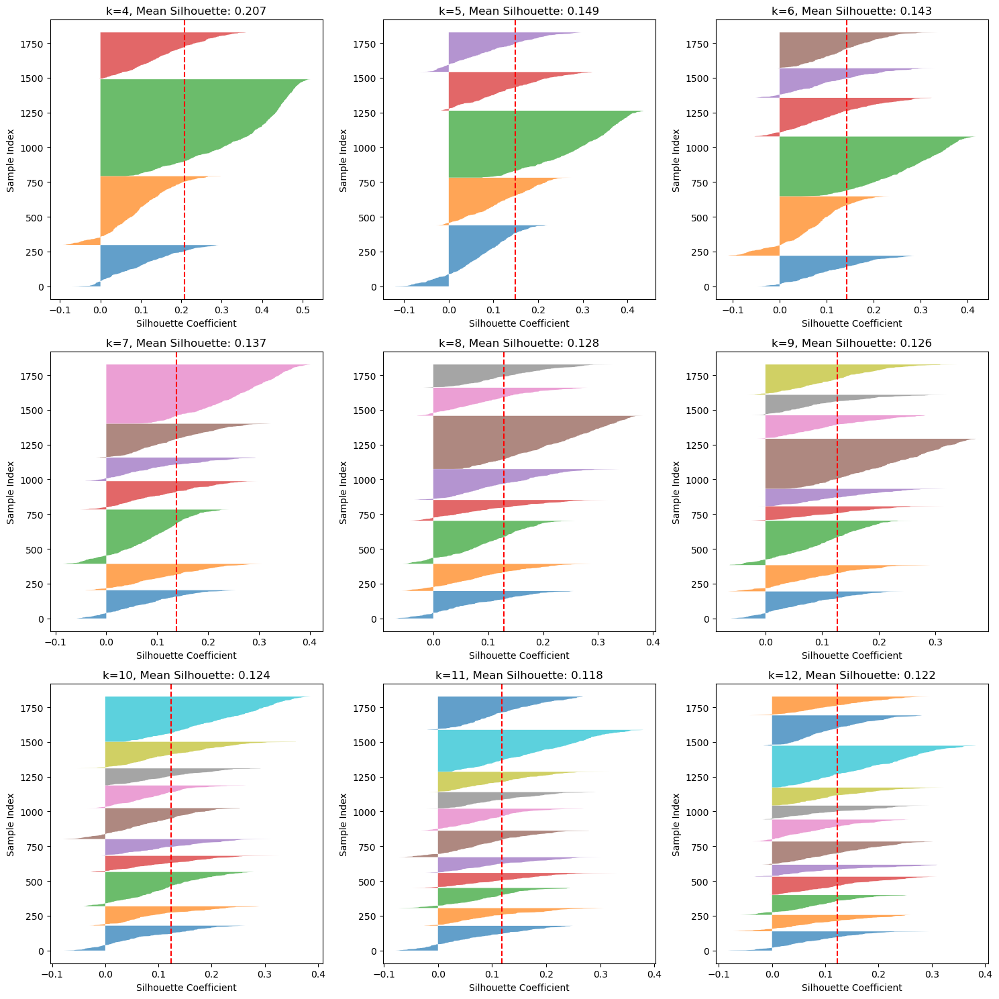

Silhouette Scores:
k=4: 0.207
k=5: 0.149
k=6: 0.143
k=7: 0.137
k=8: 0.128
k=9: 0.126
k=10: 0.124
k=11: 0.118
k=12: 0.122


In [17]:
# SILHOUETTE ANALYSIS FOR CANDIDATE K VALUES

# Run silhouette analysis 
k_candidates = [ 4, 5, 6, 7, 8, 9, 10, 11, 12] 
silhouette_results = silhouette_analysis(X_pca, k_candidates)

print("Silhouette Scores:")
for k, score in zip(k_candidates, silhouette_results):
    print(f"k={k}: {score:.3f}")

I colori non sono coerenti tra subplot diversi (il “blu” a k=3 non è lo stesso cluster del “blu” a k=4).  
I punti nei grafici sono stati riordinati: prima tutti quelli del cluster 0 (ordinati per silhouette), poi quelli del cluster 1, ecc



**La diminuzione graduale della silhouette indica che i pattern atmosferici hanno struttura continua**  
**Balance ratio di k=6 (0.36) è migliore di k=5 (0.33)**  
**Raccomandazione: I  grafici supportano sia k=5 che k=6 come scelte valide, con k=5 leggermente favorito per qualità statistica e k=6 per interpretabilità meteorologica!**

• k=2: Highest silhouette but may be too simple for meteorological patterns  
   • k=5: Suggested by Gap Statistic, good compromise  
   • k=6: Suggested by Elbow Method, more detailed patterns  
   • Consider meteorological interpretability in final choice  

<span style="color: skyblue;">**Davies-Bouldin Index**</span>  
Vantaggio: Funziona bene anche con cluster sovrapposti  
Range: [0, +∞), più basso = meglio   
Soglia: $<2.0 =$ buono, $<1.5$ = ottimo    
Motivo: Misura compattezza vs separazione ma è meno sensibile alla sovrapposizione  

The score is defined as the average similarity measure of each cluster with its most similar cluster, where similarity is the ratio of within-cluster distances to between-cluster distances. Thus, clusters which are farther apart and less dispersed will result in a better score.

The minimum score is zero, with lower values indicating better clustering.

Best value for k=4 (DB = 1.831)


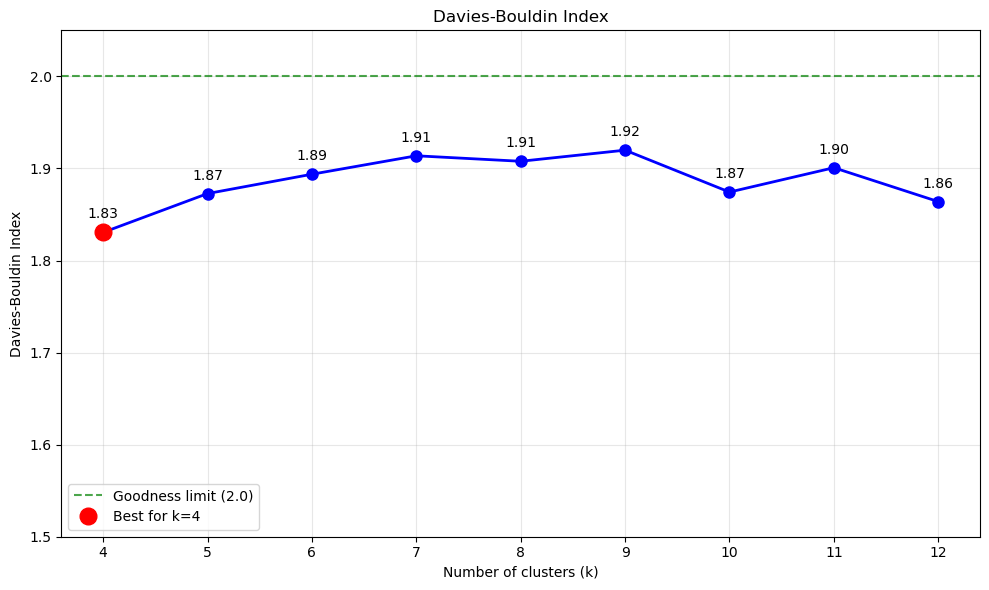


SILHOUETTE vs DAVIES-BOULDIN:
k=4: Silhouette=0.207, Davies-Bouldin=1.831
k=5: Silhouette=0.149, Davies-Bouldin=1.873
k=6: Silhouette=0.143, Davies-Bouldin=1.894
k=7: Silhouette=0.137, Davies-Bouldin=1.914
k=8: Silhouette=0.128, Davies-Bouldin=1.908
k=9: Silhouette=0.126, Davies-Bouldin=1.920
k=10: Silhouette=0.124, Davies-Bouldin=1.874
k=11: Silhouette=0.118, Davies-Bouldin=1.901
k=12: Silhouette=0.122, Davies-Bouldin=1.864


In [18]:
db_scores = davies_bouldin_analysis(X_pca, k_candidates, results)

# Confront with Silhouette
print("\nSILHOUETTE vs DAVIES-BOULDIN:")
for i, k in enumerate(k_candidates):
    if i < len(silhouette_results) and i < len(db_scores):
        print(f"k={k}: Silhouette={silhouette_results[i]:.3f}, "
              f"Davies-Bouldin={db_scores[i]:.3f}")

<span style="color: orange;">(MULTY-METHOD CONVERGENCE) The analysis reveals a typical conflict between statistical optimization and scientific interpretability. Statistical metrics (Silhouette, Davies-Bouldin) favor k=2-3, suggesting a bimodal structure in European atmospheric data. However, for k=5-7 the metrics remain within acceptable ranges: Davies-Bouldin  <2.0  indicates adequate separation, while Silhouette values (0.12-0.16) are at the lower threshold but not critical.

<span style="color: orange;">The meteorologically-motivated choice of k=5-7 is justifiable because k=2 proves too simplified to capture the complexity of European atmospheric patterns (seasonal variations, NAO+/-, blocking patterns, Mediterranean influences). The Calinski-Harabasz shows decreasing but stable values (468-602), confirming coherent internal structure. The Balance Ratio (0.44-0.54) indicates reasonably balanced clusters.</span>

<span style="color: orange;">In conclusion k=6 represents the best compromise, offering meteorological interpretative richness while maintaining acceptable statistical quality. The gradual decrease in metrics reflects the continuous nature of atmospheric processes rather than clustering defects.</span>

<span style="color: red;">_________________________________</span>

**k=6** è la scelta migliore:  --> <span style="color: orange;">per z_500 e t_850  
1. Convergenza Multi-Metodo:  
Gap Statistic: k=6 (metodo statisticamente robusto)  
Elbow: k=10 (ma spesso sovrastima)   


2. Metriche Accettabili:  
Silhouette: 0.143 (non alto ma accettabile per dati atmosferici)  
Davies-Bouldin: 1.894 (<2.0 = buono)  
Balance Ratio: 0.506 (ben bilanciato)

k=6 cattura configurazioni atmosferiche distinte:  
• Anticiclone Atlantico   
• Depressione Atlantica    
• Blocking Patterns  
• Regime Continentale  
• Pattern Mediterraneo  
• Configurazioni di Transizione  

_ _ _ - - _ _ _  

**k=5** è la scelta migliore:  --> <span style="color: orange;">per z_500_850</span>  ma gap molto male   

Gap Statistic: k=2 (troppo semplice!)  
Elbow: k=10 (sovrastima tipica)  
Derivative: k=6 (più realistico)  
Silhouette: k=4 è il picco (0.203), poi k=5 (0.192)  
Dunn Index: k=7 è il massimo (0.1119), ma k=5 è vicino (0.1103)  

Anticiclone Atlantico dominante  
Depressione Atlantica persistente  
Regime Continentale stabile  
Pattern di Blocking europeo  
Configurazioni di Transizione

 k=5 mantiene performance accettabili su tutte le metriche senza crolli evidenti. (k=6+: Calo netto in Silhouette (0.164→0.121), segno di overfitting)

_ _ _ - - _ _ _  

**k = 5 o 6** --> <span style="color: orange;">z_350_500_850</span>

k=5:  
Silhouette alta (0.176)  
Dunn accettabile (0.0935)  
Equilibrio tra qualità statistica e interpretabilità  

k=6:  
Gap Statistic ottimale  
Silhouette accettabile (0.159)  
Dunn stabile (0.0939)  

k=7+:  no   
Silhouette in calo marcato (<0.13)  
Dunn migliora ma rischio overfitting  

_ _ _ - - _ _ _  

**k= 5**--> <span style="color: orange;">z_350_500_850 + t_850</span>  

Convergenza Multi-Metodo: evita il calo evidente a 7+

Gap Statistic: k = 6 (ma molto vicino a k = 5)  
Elbow: k = 9 (tendenza a sovrastimare)  
Derivative: k = 7 (più realistico)  
Silhouette: k = 4 è il picco (0.187), ma k = 5 mantiene un ottimo score (0.176)  

Silhouette k=5: 0.176 (molto buono per dati atmosferici)  
Dunn Index k=5: 0.0935 (accettabile, migliora rispetto a k=4)  
Gap Statistic: k=6 ha solo un leggero vantaggio su k=5

Regime Anticiclonico Atlantico  
Regime Depressionario Atlantico  
Regime Continentale  
Regime di Blocking Europeo   
Regime Mediterraneo/Transizione    
k=5 rappresenta il miglior compromesso tra qualità statistica (Silhouette alto), interpretabilità meteorologica (5 regimi distinti), e stabilità (evita overfitting). È la scelta più robusta per l' analisi climatologica.

<span style="color: red;">|_________________________________|</span>

<span style="color: skyblue;">una volta che ho scelto quanti cluster tenere STAMPO I VETTORI DEI CENTROIDI FINALI</span>

## 4 Clusering Analysis
Analisi dei cluster scelti

_ _ _ - -  
scrivo un paragrafo su che k scelgo  
_ _ _ - -  

Ogni cluster rappresenta un regime meteorologico tipico dell'Europa. I centroidi  sono i "pattern medi" di ogni regime. Quando plotto le mappe, vedo:

Centri di alta/bassa pressione tipici di quel regime  
Gradiente barico (quanto velocemente cambia la pressione nello spazio)  
Configurazioni sinottiche ricorrenti (anticicloni, depressioni, blocchi)  

Ogni centroide è un vettore di 20 dimensioni (nello spazio PCA)
Rappresenta il punto medio di tutti i giorni appartenenti a quel cluster

In [19]:
# Analyze final clustering results
k_final = 7
final_labels = results["labels"][k_final]
final_centroids = results["centroids"][k_final]
print (f"Final centroids shape {final_centroids.shape}")

Final centroids shape (7, 20)


Ogni valore del vettore di un centroide mi dice qunto forte quella componente principale contribuisce al pattern descritto dal primo centroide. Il segno indica in che direzione la componente viene applicata.

Se penso al mio centroide come un punto in uno spazio 20-D allora:  
.          PC2 ↑  
.              |  
.              |  • ← Il mio centroide è QUI  
.              |     coordinate: (-8.96, 7.11, -0.45, ...)   
.         -----+-----→ PC1  
.              |  
.              |  

Ma invece di 2 dimensioni (PC1, PC2), ho 20 assi diversi tutti perpendicolari tra loro!

<span style="color: orange;"> Inizialmente quando parto dai miei dati originali ho una matrice 1827x129042 (n_samples (giorni) x n_features(combinazione di tutte le mie variabili nella griglia latxlon)).  
Poi Con la standardizzazione centro tutti i miei dati su media 0 e std 1, ma le dimensioni restano le stesse.  
Poi con l'analisi delle componenti principali cerco di ridurre la dimensionalità trovando solo le prime 20 componenti principali che meglio spiegano la mia varianza. In particolare trovo una matrice 20x129042 (che chiamo matrice pca) dove ogni riga è una componente principale e le colonne sono il mio n_features, ogni riga della matrice ipca.components_ è effettivamente la "ricetta" (combinazione lineare) per costruire quella componente principale dalle features originali.  
Poi quello che faccio è moltiplicare la mia matrice originale 1827x129042 per la matrice pca 20x129042 trasposta e ottengo la mia matrice finale del nuovo dataset 1827x20 (cioè ho solo 20 "nuove features" == comp princ) OGNI GIORNO VIENE PROIETTATO SU QUESTE 20 DIREZIONI. Una riga di X_pca (es. riga i) rappresenta il "profilo PCA" del giorno i.Ogni valore mi dice: Quanto forte quel giorno "assomiglia" a quella componente principale e in che direzione (+ o -) il pattern di quel giorno si allinea con la PC.

_ _ _ - - _ _ _ 

**ipca.inverse_transform(centroids)** --> Transform data back to its original space. In other words, return an input X_original whose transform would be X.   
Returns:  
X_original : array-like of shape (n_samples, n_features). Original data, where n_samples is the number of samples and n_features is the number of features.  
Notes  
If whitening is enabled, inverse_transform will compute the exact inverse operation, which includes reversing whitening.



ipca.inverse_transform(centroids)

Prende il centroide (vettore 20D nello spazio PCA)  
Lo moltiplica per la matrice delle componenti principali (20 × 130k)  
Risultato: vettore 130k nello spazio standardizzato  

\* global_std + global_mean

Inverte la standardizzazione globale  
Riporta i valori in metri (per geopotenziale) e Kelvin (per temperatura)  

<span style= "color: orange;">Io parto dallo scegliere 7 centroidi, quindi ho una metrice 7x20 (7 centroidi ognuno con i suoi 20 coefficienti dell CP.)
Ora supponiamo di prendere solo il primo centroide è un vettore con 20 elementi. Esso lo moltiplico per pca_matrix per ottenere i valori originali per le mie features relative a questo centroide. Quindi ottengo un vettore lungo 129042.
Ora faccio questo per tutti i miei 7 centroidi e quindi ottengo una matrice 7x129042 (IPCA inverted).
Ora per riottenere i 'valori veri' devo moltiplicare ogni singola riga di questa matrice per la std e ci sommo la media. E ho smepre una 7x129042.

In [20]:
# Reconstruct meteorological patterns from PCA centroids

def reconstruct_physical_patterns(centroids, ipca, global_mean, global_std, 
                                 ds_filtered):
    """
    Reconstruct the meteorological patterns from PCA centroids
    """
    # Step 1 : Inverse PCA
    print(f"Input centroids shape: {centroids.shape}")
    centroids_original_space = ipca.inverse_transform(centroids)
    print(f"IPCA inverted: {centroids_original_space.shape}")

    # Step 2 : Destandardization to reobtain the physical values
    centroids_physical = centroids_original_space * global_std + global_mean
    print(f"Destandardized values: {centroids_physical.shape}")
    

    # Step 3 : Reshape for each cluster
    n_lat = ds_filtered.dims['latitude']
    n_lon = ds_filtered.dims['longitude']
    spatial_size= n_lat * n_lon
    print(f"Spatial dimensions: {n_lat} lat x {n_lon} lon = {spatial_size} points")

    # Step 4 : reconstruct each cluster pattern
    cluster_patterns = {}

    for cluster_id in range(len(centroids_physical)):
        pattern_vector = centroids_physical[cluster_id] # (129042,)
        patterns = {}

        # Extract z (geopotential at 500 hPa)
        z_values = pattern_vector[:spatial_size]   # First 64521 values
        z_map = z_values.reshape(n_lat, n_lon)
        patterns['z'] = z_map

        # Extract t (temperature at 850 hPa)
        t_values = pattern_vector[spatial_size: 2 * spatial_size]  # Next 64521 values
        t_map = t_values.reshape(n_lat, n_lon)
        patterns['t'] = t_map

        cluster_patterns[cluster_id] = patterns
        print(f"Cluster {cluster_id}: Z {z_map.shape} - Range [{z_map.min():.1f}, {z_map.max():.1f}]")
        print(f"Cluster {cluster_id}: T {t_map.shape} - Range [{t_map.min():.1f}, {t_map.max():.1f}]")

    return cluster_patterns

# ESEGUI LA RICOSTRUZIONE
cluster_patterns = reconstruct_physical_patterns(final_centroids, ipca, global_mean, global_std, ds_filtered)

Input centroids shape: (7, 20)
IPCA inverted: (7, 129042)
Destandardized values: (7, 129042)
Spatial dimensions: 201 lat x 321 lon = 64521 points
Cluster 0: Z (201, 321) - Range [50109.6, 57357.3]
Cluster 0: T (201, 321) - Range [258.2, 293.1]
Cluster 1: Z (201, 321) - Range [54057.7, 58184.8]
Cluster 1: T (201, 321) - Range [272.3, 303.6]
Cluster 2: Z (201, 321) - Range [50130.8, 57296.4]
Cluster 2: T (201, 321) - Range [256.5, 291.9]
Cluster 3: Z (201, 321) - Range [52337.5, 57601.7]
Cluster 3: T (201, 321) - Range [264.4, 297.7]
Cluster 4: Z (201, 321) - Range [50377.8, 57366.7]
Cluster 4: T (201, 321) - Range [254.7, 290.9]
Cluster 5: Z (201, 321) - Range [51889.2, 57516.3]
Cluster 5: T (201, 321) - Range [261.3, 295.4]
Cluster 6: Z (201, 321) - Range [53206.3, 57856.7]
Cluster 6: T (201, 321) - Range [267.8, 299.9]


MAPPE METEOROLOGICHE DEI CLUSTER
CLUSTER 0:


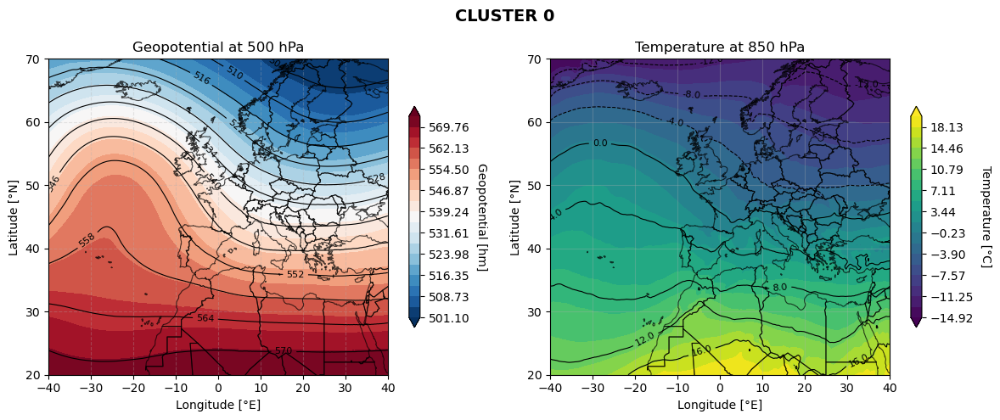


 STATISTICHE CLUSTER: 0
Geopotenziale 500 hPa:
   • Media: 544 dam
   • Range: 501 - 574 dam
   • Variabilità: 20 dam
Temperatura 850 hPa:
   • Media: 275.1 K (2.0°C)
   • Range: -14.9 - 20.0 K
   • Variabilità: 8.4 K
CLUSTER 1:


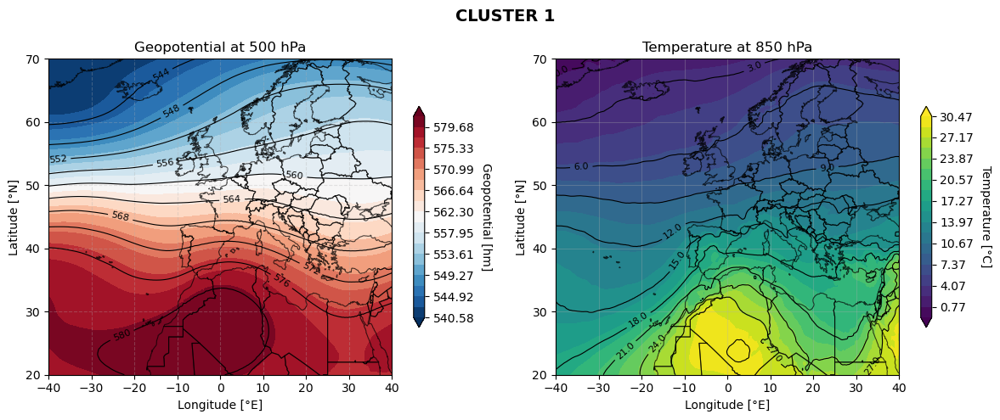


 STATISTICHE CLUSTER: 1
Geopotenziale 500 hPa:
   • Media: 565 dam
   • Range: 541 - 582 dam
   • Variabilità: 12 dam
Temperatura 850 hPa:
   • Media: 286.1 K (13.0°C)
   • Range: -0.9 - 30.5 K
   • Variabilità: 7.9 K
CLUSTER 2:


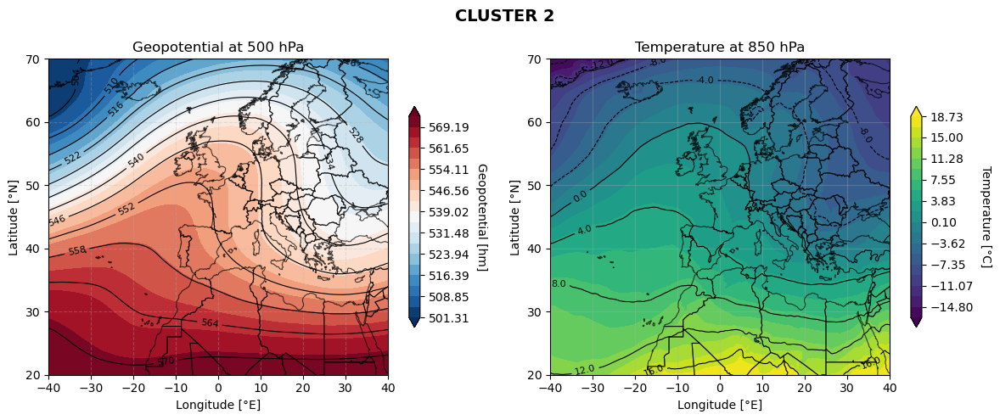


 STATISTICHE CLUSTER: 2
Geopotenziale 500 hPa:
   • Media: 545 dam
   • Range: 501 - 573 dam
   • Variabilità: 18 dam
Temperatura 850 hPa:
   • Media: 275.1 K (2.0°C)
   • Range: -16.7 - 18.7 K
   • Variabilità: 7.2 K
CLUSTER 3:


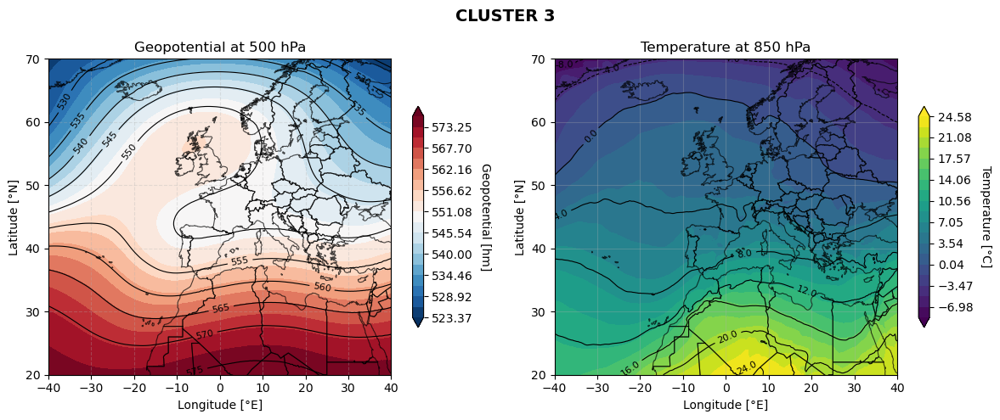


 STATISTICHE CLUSTER: 3
Geopotenziale 500 hPa:
   • Media: 553 dam
   • Range: 523 - 576 dam
   • Variabilità: 12 dam
Temperatura 850 hPa:
   • Media: 279.0 K (5.9°C)
   • Range: -8.7 - 24.6 K
   • Variabilità: 7.3 K
CLUSTER 4:


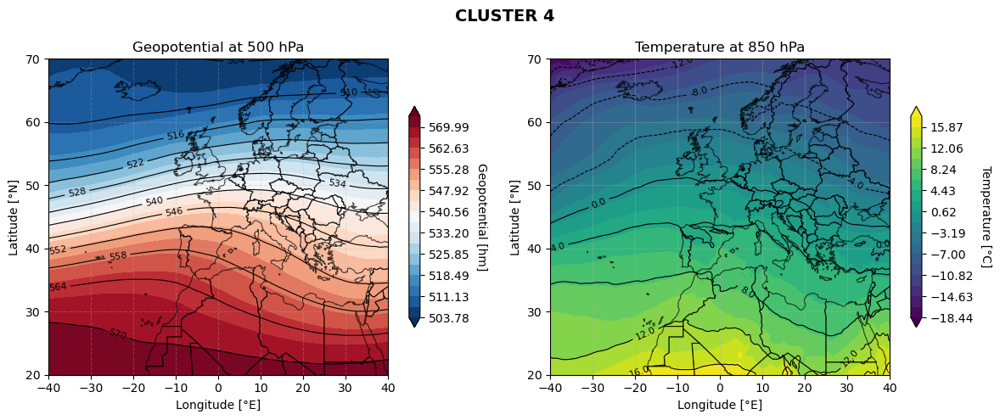


 STATISTICHE CLUSTER: 4
Geopotenziale 500 hPa:
   • Media: 541 dam
   • Range: 504 - 574 dam
   • Variabilità: 23 dam
Temperatura 850 hPa:
   • Media: 274.5 K (1.3°C)
   • Range: -18.4 - 17.8 K
   • Variabilità: 8.0 K
CLUSTER 5:


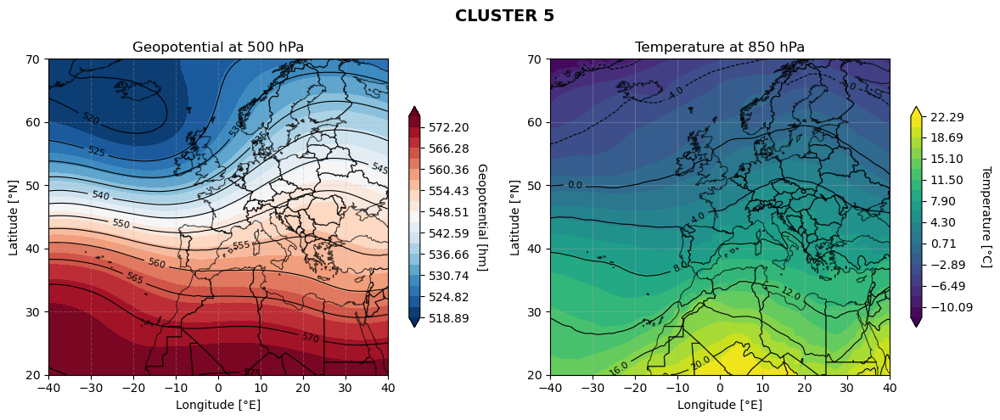


 STATISTICHE CLUSTER: 5
Geopotenziale 500 hPa:
   • Media: 549 dam
   • Range: 519 - 575 dam
   • Variabilità: 18 dam
Temperatura 850 hPa:
   • Media: 278.3 K (5.2°C)
   • Range: -11.9 - 22.3 K
   • Variabilità: 7.5 K
CLUSTER 6:


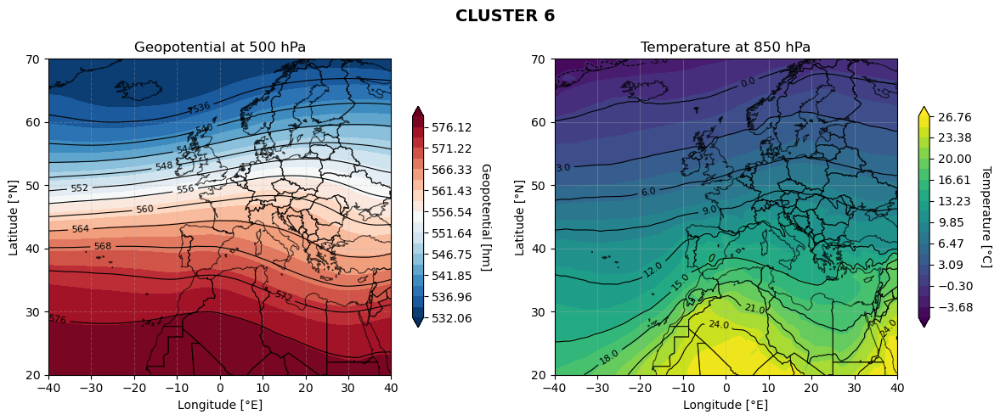


 STATISTICHE CLUSTER: 6
Geopotenziale 500 hPa:
   • Media: 558 dam
   • Range: 532 - 579 dam
   • Variabilità: 16 dam
Temperatura 850 hPa:
   • Media: 283.0 K (9.8°C)
   • Range: -5.4 - 26.8 K
   • Variabilità: 7.9 K


In [34]:
# tengo
# Visualization

def plot_cluster_meteorological_maps(cluster_patterns, lats, lons, sf=None):
    """
    Visualizza le mappe meteorologiche 
    """
    
    for cluster_id, pattern in cluster_patterns.items():
        print(f"CLUSTER {cluster_id}:")
        
        # Create the plots
        fig, axes = plt.subplots(1, 2, figsize=(12, 5))

        lon_grid, lat_grid = np.meshgrid(lons, lats)
        
        # PLOT GEOPOTENZIALE (Z)
        ax = axes[0]
        z_data = pattern['z']  # Shape: (201, 321)
        z_data_dam = z_data / 100
                
        z_levels = np.linspace(z_data_dam.min(), z_data_dam.max(), 20)
        contour_z = ax.contourf(lon_grid, lat_grid, z_data_dam,
                               levels=z_levels, cmap='RdBu_r', extend='both')

        contour_lines_z = ax.contour(lon_grid, lat_grid, z_data_dam,
                                    levels=12, colors='black', linewidths=0.8)
        ax.clabel(contour_lines_z, inline=True, fontsize=8, fmt='%.0f')

        # Confini europei
        if sf is not None:
            add_country_boundaries(ax, sf)
                
        # Styling
        ax.set_title(f'Geopotential at 500 hPa')
        ax.set_xlabel('Longitude [°E]')
        ax.set_ylabel('Latitude [°N]')
        ax.set_xlim([lons.min(), lons.max()])
        ax.set_ylim([lats.min(), lats.max()])
        ax.grid(True, alpha=0.3, linestyle='--')
                
        # Colorbar
        cbar_z = plt.colorbar(contour_z, ax=ax, shrink=0.7)
        cbar_z.set_label('Geopotential [hm]', rotation=270, labelpad=15)
        
        # PLOT TEMPERATURA (T)
        ax = axes[1]
        t_data = pattern['t']  # Shape: (201, 321)
        t_data_celsius = t_data - 273.15
        
        # Contour plot per temperatura
        t_levels = np.linspace(t_data_celsius.min(), t_data_celsius.max(), 20)
        contour_t = ax.contourf(lon_grid, lat_grid, t_data_celsius, 
                               levels=t_levels, cmap='viridis', extend='both')
        
        # Linee di contorno
        contour_lines_t = ax.contour(lon_grid, lat_grid, t_data_celsius, 
                                    levels=10, colors='black', linewidths=0.8)
        ax.clabel(contour_lines_t, inline=True, fontsize=8, fmt='%.1f')
        
        # Confini europei
        if sf is not None:
            add_country_boundaries(ax, sf)
        
        # Styling
        ax.set_title('Temperature at 850 hPa')
        ax.set_xlabel('Longitude [°E]')
        ax.set_ylabel('Latitude [°N]')
        ax.set_xlim([lons.min(), lons.max()])
        ax.set_ylim([lats.min(), lats.max()])
        ax.grid(True, alpha=0.3)
        
        # Colorbar
        cbar_t = plt.colorbar(contour_t, ax=ax, shrink=0.7)
        cbar_t.set_label('Temperature [°C]', rotation=270, labelpad=15)
        
        # Titolo generale
        fig.suptitle(f'CLUSTER {cluster_id}', 
                    fontsize=14, fontweight='bold')
        
        plt.tight_layout()
        plt.show()

        print_cluster_stats(cluster_id, pattern)

def print_cluster_stats(cluster_id, pattern):
    """
    Stampa statistiche semplici per il cluster
    """
    print(f"\n STATISTICHE CLUSTER: {cluster_id}")
    
    # Geopotenziale
    z_data = pattern['z']
    z_data_dam = z_data / 100
    print(f"Geopotenziale 500 hPa:")
    print(f"   • Media: {z_data_dam.mean():.0f} dam")
    print(f"   • Range: {z_data_dam.min():.0f} - {z_data_dam.max():.0f} dam")
    print(f"   • Variabilità: {z_data_dam.std():.0f} dam")

    # Temperatura
    t_data = pattern['t']
    t_data_celsius = t_data - 273.15
    print(f"Temperatura 850 hPa:")
    print(f"   • Media: {t_data.mean():.1f} K ({t_data_celsius.mean():.1f}°C)")
    print(f"   • Range: {t_data_celsius.min():.1f} - {t_data_celsius.max():.1f} K")
    print(f"   • Variabilità: {t_data_celsius.std():.1f} K")

#  ESECUZIONE SEMPLIFICATA
print("MAPPE METEOROLOGICHE DEI CLUSTER")


plot_cluster_meteorological_maps(cluster_patterns, lats, lons, sf)


<span style= "color:orange;"> cluster_names = {  
        0: "Atlantic Ridge", 1: "European Blocking", 2: "Continental High",  
        3: "Scandinavian Low", 4: "Mediterranean High", 5: "Transitional",  
        6: "Mixed Pattern", 7: "Atlantic Storm Track"  
    }

ogni mappa che vedo è una configurazione media tipica di quel regime atmosferico, non un singolo evento

Soluzioni per vedere le "vere configurazioni":  
1. Mappe Composite più specifiche  
invece del centroide, calcola:  
- Il giorno più rappresentativo del cluster (quello più vicino al centroide)  
- La mediana invece della media  
- Percentili (10°, 50°, 90°) per vedere la variabilità  

2. Analisi di sottogruppi  
Divide ogni cluster in sotto-pattern:  
- Stagionali (inverno vs estate dello stesso regime)  
- Geografici (blocking nordico vs blocking mediterraneo)  

3. Anomalie invece di valori assoluti (fatto sotto)

<span style= "color: red;">COME INTERPRETARE I  CLUSTER:  
_Dove sono i centri di alta/bassa pressione?_  
Nord Europa vs Sud Europa?  
Atlantico vs Europa continentale?  

<span style= "color: red;">_Che gradiente vedi?_  
Nord-Sud (tipo NAO)?  
Ovest-Est (tipo continentale)?  
Patterns locali (blocking)?  

<span style= "color: red;">_Coerenza termica:_  
Temperature calde sotto alta pressione?  
Temperature fredde sotto bassa pressione?

🌊 NAO+: Alta pressione SUD + Bassa pressione NORD  
❄️ NAO-: Configurazione opposta   
🔒 BLOCKING: Alta pressione al CENTRO Europa  
🌪️ STORM TRACK: Sequenza di depressioni da OVEST  
🏔️ CONTINENTAL: Alta pressione da EST  

<span style= "color: orange;">**Cluster 0**  
500 hPa: flusso molto zonale (quasi linee parallele da ovest a est), con geopotenziali relativamente alti sull’Europa centro-meridionale e più bassi sul Nord Europa.  
850 hPa: temperature più fredde sul Nord Europa e più miti sul Mediterraneo.  
Questo sembra un regime di NAO positiva (NAO+): correnti occidentali tese, tempo mite e umido sul Mediterraneo, più freddo e perturbato sul Nord Europa.

<span style= "color: orange;">**Cluster 1**  
500 hPa: dorsale subtropicale molto pronunciata che si spinge verso nord sopra il Mediterraneo, mentre sul Nord Europa il flusso rimane più basso.  
850 hPa: forti anomalie calde su Nord Africa / Mediterraneo occidentale.  
Questo sembra un blocco subtropicale / regime anticiclonico sul Mediterraneo. In termini teleconnettivi, potrebbe assomigliare a una situazione EA+ (Eastern Atlantic positive) o un’estensione della cella di Hadley.

<span style= "color: orange;">**Cluster 2**  
500 hPa: si vede una saccatura che scende dall’Atlantico verso Francia-Iberia, con flusso più meridiano.  
850 hPa: aria fredda che scende più a ovest, aria mite che risale verso l’Italia/Grecia.  
Questo ha le caratteristiche di una NAO negativa (NAO−) o quantomeno una configurazione a saccatura atlantica che porta maltempo sull’Europa occidentale e anticiclone relativo più a est.

_______________________________

anomalies

In [35]:
def plot_cluster_anomalies_maps(cluster_patterns, pressure_levels, lats, lons, global_mean_pattern, k_final,  sf=None):
    """
    Visualizza le ANOMALIE dei cluster rispetto alla media globale - VERSIONE CORRETTA
    """
    
    # 🚨 FIX: Usa le dimensioni corrette dal ds_filtered
    # Determina quanti livelli di pressione abbiamo nei dati filtrati
    if 'z' in list(cluster_patterns.values())[0]:
        z_shape = list(cluster_patterns.values())[0]['z'].shape
        n_z_levels = z_shape[0]  # Numero effettivo di livelli Z
    else:
        n_z_levels = 0
    
    if 't' in list(cluster_patterns.values())[0]:
        n_t_levels = 1  # T è sempre a 1 livello (850 hPa)
    else:
        n_t_levels = 0
    
    # CALCOLA LE DIMENSIONI CORRETTE
    n_lat = len(lats)
    n_lon = len(lons)
    
    # Reshape CORRETTO per global_mean_pattern
    total_z_size = n_z_levels * n_lat * n_lon
    total_t_size = n_t_levels * n_lat * n_lon
    
    # Estrai la parte Z e T dal global_mean_pattern
    if n_z_levels > 0:
        global_mean_z = global_mean_pattern[:total_z_size].reshape(n_z_levels, n_lat, n_lon)
    if n_t_levels > 0:
        global_mean_t = global_mean_pattern[total_z_size:total_z_size + total_t_size].reshape(n_t_levels, n_lat, n_lon)
    
    # Determina i livelli di pressione effettivi dal ds_filtered
    pressure_levels_filtered = []
    if 'z' in ds_filtered.data_vars:
        if hasattr(ds_filtered['z'], 'isobaricInhPa'):
            pressure_levels_filtered.extend(ds_filtered['z'].isobaricInhPa.values.tolist())
        else:
            pressure_levels_filtered.append(500)  # Default per Z a 500 hPa

    print(f"DEBUG INFO:")
    print(f"   • N_z_levels: {n_z_levels}")
    print(f"   • N_t_levels: {n_t_levels}")
    print(f"   • Pressure levels filtered: {pressure_levels_filtered}")
    print(f"   • Global mean pattern shape: {global_mean_pattern.shape}")
    print(f"   • Expected total size: {total_z_size + total_t_size}")
    
    for cluster_id, pattern in cluster_patterns.items():
        print(f"\n" + "="*60)
        print(f"CLUSTER {cluster_id} - ANOMALIE (Deviazioni dalla media)")
        print("="*60)
        
        # PLOT ANOMALIE GEOPOTENZIALE
        if 'z' in pattern and n_z_levels > 0:
            z_data = pattern['z']
            
            fig, axes = plt.subplots(1, n_z_levels, figsize=(6*n_z_levels, 5))
            if n_z_levels == 1:
                axes = [axes]
            
            for i, pressure in enumerate(pressure_levels_filtered[:n_z_levels]):
                ax = axes[i]
                
                # CALCOLA ANOMALIA = cluster - media_globale
                data_anomaly = z_data[i, :, :] - global_mean_z[i, :, :]
                
                # Griglia lat/lon
                lon_grid, lat_grid = np.meshgrid(lons, lats)
                
                # SCALA SIMMETRICA per le anomalie
                max_abs = max(abs(data_anomaly.min()), abs(data_anomaly.max()))
                vmin, vmax = -max_abs, max_abs
                
                # CONTOUR per anomalie
                levels = np.linspace(vmin, vmax, 20)
                contour_filled = ax.contourf(lon_grid, lat_grid, data_anomaly, 
                                           levels=levels, cmap='RdBu_r', 
                                           extend='both', vmin=vmin, vmax=vmax)
                
                # CONTOUR LINES per evidenziare cicloni (valori negativi)
                contour_negative = ax.contour(lon_grid, lat_grid, data_anomaly, 
                                            levels=np.arange(-300, 0, 50), 
                                            colors='blue', linewidths=1.5, linestyles='-')
                
                # CONTOUR LINES per anticicloni (valori positivi)
                contour_positive = ax.contour(lon_grid, lat_grid, data_anomaly, 
                                            levels=np.arange(50, 300, 50), 
                                            colors='red', linewidths=1.5, linestyles='-')
                
                # Etichette
                ax.clabel(contour_negative, inline=True, fontsize=8, fmt='%.0f')
                ax.clabel(contour_positive, inline=True, fontsize=8, fmt='%.0f')
                
                # Confini europei
                if sf is not None:
                    add_country_boundaries(ax, sf)
                
                # Styling
                ax.set_title(f'Anomalie Geopotenziale {pressure} hPa', 
                           fontsize=12, fontweight='bold')
                ax.set_xlabel('Longitude [°E]', fontsize=10)
                ax.set_ylabel('Latitude [°N]', fontsize=10)
                ax.set_xlim([lons.min(), lons.max()])
                ax.set_ylim([lats.min(), lats.max()])
                ax.grid(True, alpha=0.3)
                
                # Colorbar
                cbar = plt.colorbar(contour_filled, ax=ax, shrink=0.7)
                cbar.set_label('Anomalia Geopotenziale [m]', rotation=270, labelpad=15)
                
                # Evidenzia cicloni e anticicloni nel plot
                min_val = data_anomaly.min()
                max_val = data_anomaly.max()
                
                if min_val < -100:
                    ax.text(0.02, 0.98, f'🌀 Ciclone: {min_val:.0f}m', 
                           transform=ax.transAxes, verticalalignment='top',
                           bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.8))
                
                if max_val > 100:
                    ax.text(0.02, 0.85, f'🔴 Anticiclone: +{max_val:.0f}m', 
                           transform=ax.transAxes, verticalalignment='top',
                           bbox=dict(boxstyle='round', facecolor='lightcoral', alpha=0.8))
            
            plt.suptitle(f'CLUSTER {cluster_id} - ANOMALIE GEOPOTENZIALE', 
                        fontsize=14, fontweight='bold')
            plt.tight_layout()
            plt.show()
        
        # PLOT ANOMALIE TEMPERATURA (se presente)
        if 't' in pattern and n_t_levels > 0:
            t_data = pattern['t']
            
            fig, ax = plt.subplots(1, 1, figsize=(8, 6))
            
            # CALCOLA ANOMALIA TEMPERATURA
            data_anomaly = t_data[0, :, :] - global_mean_t[0, :, :]
            
            # Griglia lat/lon
            lon_grid, lat_grid = np.meshgrid(lons, lats)
            
            # SCALA SIMMETRICA per le anomalie di temperatura
            max_abs = max(abs(data_anomaly.min()), abs(data_anomaly.max()))
            vmin, vmax = -max_abs, max_abs
            
            # CONTOUR per anomalie di temperatura
            levels = np.linspace(vmin, vmax, 20)
            contour_filled = ax.contourf(lon_grid, lat_grid, data_anomaly, 
                                       levels=levels, cmap='coolwarm', 
                                       extend='both', vmin=vmin, vmax=vmax)
            
            # CONTOUR LINES
            contour_lines = ax.contour(lon_grid, lat_grid, data_anomaly, 
                                     levels=10, colors='black', 
                                     linewidths=0.8, alpha=0.7)
            
            ax.clabel(contour_lines, inline=True, fontsize=8, fmt='%.1f')
            
            # Confini europei
            if sf is not None:
                add_country_boundaries(ax, sf)
            
            # Styling
            ax.set_title(f'CLUSTER {cluster_id} - Anomalie Temperatura 850 hPa', 
                       fontsize=14, fontweight='bold')
            ax.set_xlabel('Longitude [°E]', fontsize=12)
            ax.set_ylabel('Latitude [°N]', fontsize=12)
            ax.set_xlim([lons.min(), lons.max()])
            ax.set_ylim([lats.min(), lats.max()])
            ax.grid(True, alpha=0.3)
            
            # Colorbar
            cbar = plt.colorbar(contour_filled, ax=ax, shrink=0.8)
            cbar.set_label('Anomalia Temperatura [K]', rotation=270, labelpad=15)
            
            plt.tight_layout()
            plt.show()

# 🔧 CALCOLO CORRETTO DELLA MEDIA GLOBALE
def calculate_global_mean_pattern(X, ds_filtered):
    """
    Calcola il pattern medio globale dei dati originali - VERSIONE CORRETTA
    """
    # Media lungo la dimensione temporale
    global_mean_vector = X.mean(axis=0)
    
    # De-standardizza
    global_mean_physical = global_mean_vector * global_std + global_mean
    
    return global_mean_physical

# ESEGUI IL CALCOLO CORRETTO
print("🔧 Ricalcolo della media globale con dimensioni corrette...")
global_mean_pattern = calculate_global_mean_pattern(X, ds_filtered)

print(f"✅ Global mean pattern shape: {global_mean_pattern.shape}")
print(f"✅ Expected size: {X.shape[1]} features")

# Visualizza le anomalie con la funzione corretta
plot_cluster_anomalies_maps(cluster_patterns, pressure_levels, lats, lons, 
                           global_mean_pattern, k_final, sf)

🔧 Ricalcolo della media globale con dimensioni corrette...
✅ Global mean pattern shape: (129042,)
✅ Expected size: 129042 features


ValueError: cannot reshape array of size 129042 into shape (201,201,321)

In [ ]:
def find_most_representative_days(cluster_id, final_labels, final_centroids, X_pca, n_days = 3):
    """
    Trova il giorno più rappresentativo (più vicino al centroide) per un cluster

    """
    # Trova tutti i giorni appartenenti al cluster
    cluster_mask = final_labels == cluster_id
    cluster_points = X_pca[cluster_mask]
    centroid = final_centroids[cluster_id]
    
    # Calcola distanze euclidee dal centroide
    distances = np.linalg.norm(cluster_points - centroid, axis=1)
    
    # Trova l'indice del punto più vicino (distanza minima)
    closest_idx_in_cluster = np.argsort(distances)[:n_days]
    
    # Trova l'indice originale nel dataset completo
    original_indices = np.where(cluster_mask)[0]
    most_representative_day_idx = original_indices[closest_idx_in_cluster]
    
    return most_representative_day_idx, distances[closest_idx_in_cluster]

🔍 ANALISI DEI TOP 3 GIORNI PIÙ RAPPRESENTATIVI
TOP 3 GIORNI PIÙ RAPPRESENTATIVI PER CLUSTER

Cluster 0 (192 giorni):
  1. 2004-01-18 - Distanza: 5.412 - Rappresentatività: 43.6%
  2. 2001-04-16 - Distanza: 6.554 - Rappresentatività: 31.6%
  3. 2000-03-26 - Distanza: 6.651 - Rappresentatività: 30.6%

Cluster 1 (409 giorni):
  1. 2003-07-05 - Distanza: 3.202 - Rappresentatività: 50.5%
  2. 2003-07-07 - Distanza: 3.582 - Rappresentatività: 44.6%
  3. 2003-07-04 - Distanza: 3.628 - Rappresentatività: 43.9%

Cluster 2 (216 giorni):
  1. 2003-02-12 - Distanza: 5.610 - Rappresentatività: 36.3%
  2. 2002-03-31 - Distanza: 5.800 - Rappresentatività: 34.1%
  3. 2002-03-27 - Distanza: 5.957 - Rappresentatività: 32.4%

Cluster 3 (187 giorni):
  1. 2000-05-05 - Distanza: 5.166 - Rappresentatività: 39.3%
  2. 2004-05-24 - Distanza: 5.194 - Rappresentatività: 38.9%
  3. 2000-05-07 - Distanza: 5.196 - Rappresentatività: 38.9%

Cluster 4 (227 giorni):
  1. 2002-01-20 - Distanza: 4.187 - Rappresentativi

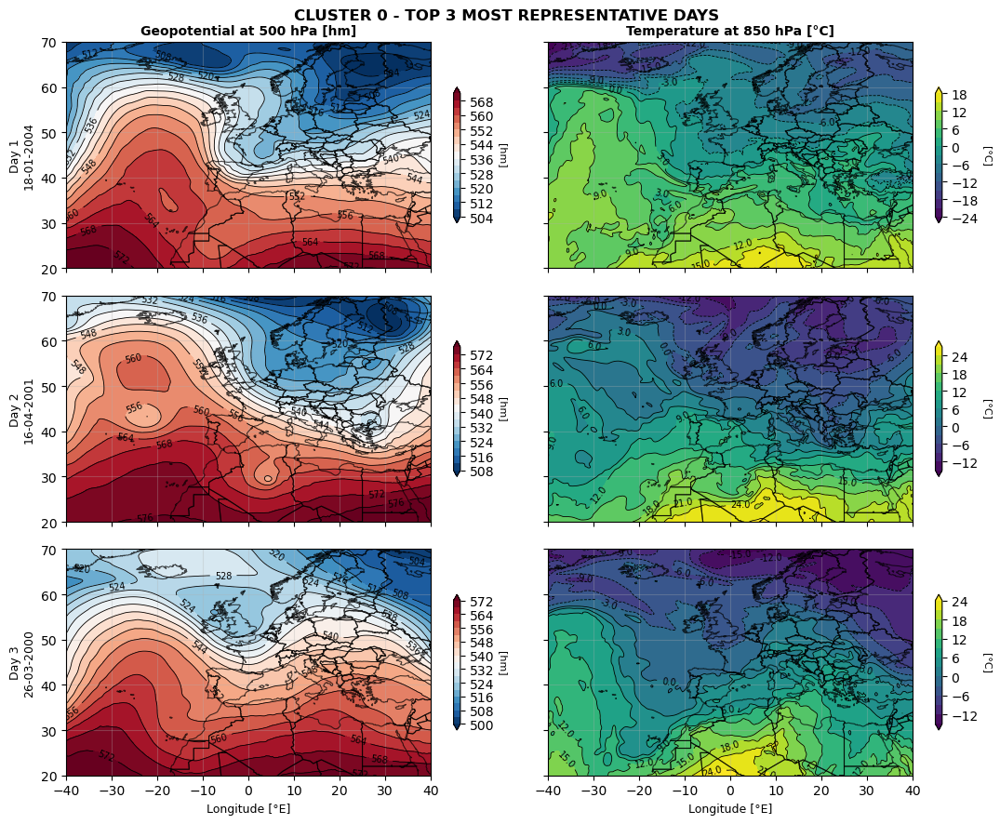

CLUSTER 1 - TOP 3 GIORNI PIÙ RAPPRESENTATIVI
  1. 05-07-2003 (Saturday) - Rappresentatività: 50.5%
  2. 07-07-2003 (Monday) - Rappresentatività: 44.6%
  3. 04-07-2003 (Friday) - Rappresentatività: 43.9%


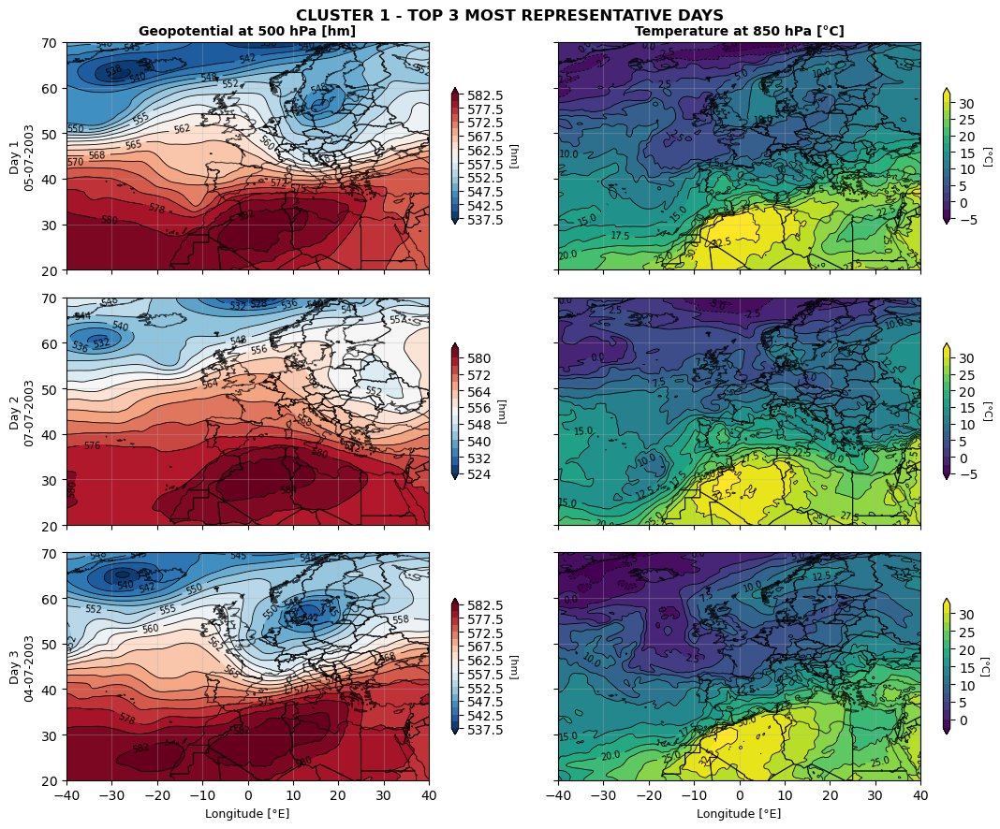

CLUSTER 2 - TOP 3 GIORNI PIÙ RAPPRESENTATIVI
  1. 12-02-2003 (Wednesday) - Rappresentatività: 36.3%
  2. 31-03-2002 (Sunday) - Rappresentatività: 34.1%
  3. 27-03-2002 (Wednesday) - Rappresentatività: 32.4%


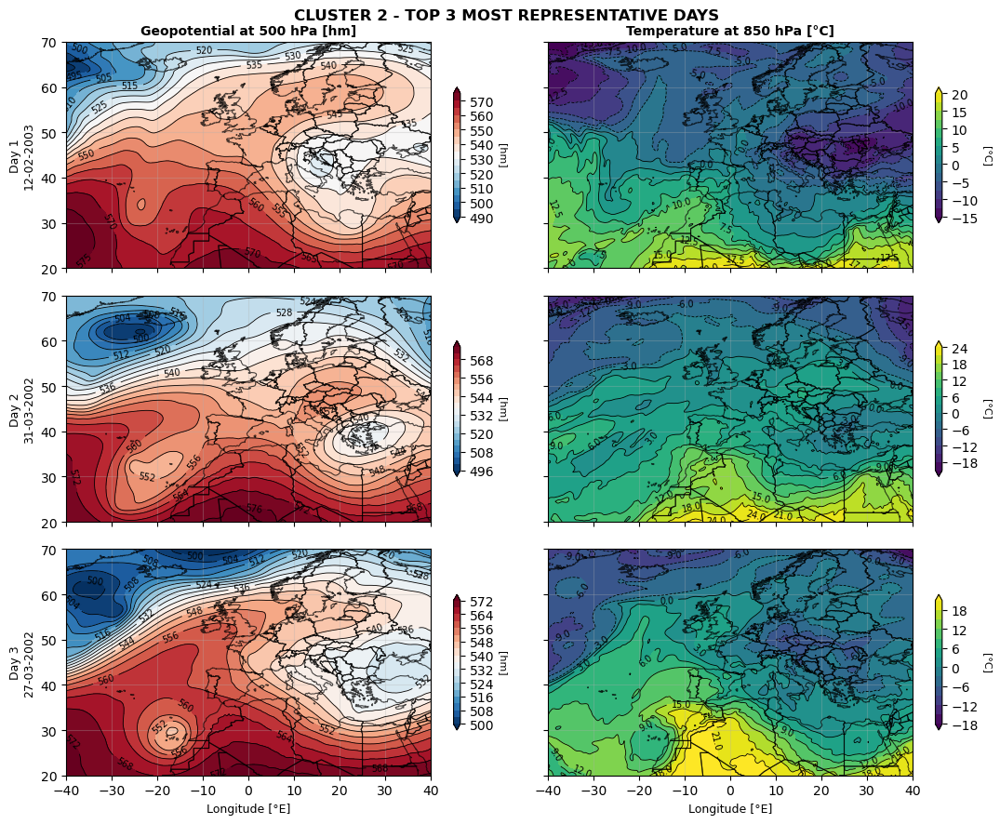

CLUSTER 3 - TOP 3 GIORNI PIÙ RAPPRESENTATIVI
  1. 05-05-2000 (Friday) - Rappresentatività: 39.3%
  2. 24-05-2004 (Monday) - Rappresentatività: 38.9%
  3. 07-05-2000 (Sunday) - Rappresentatività: 38.9%


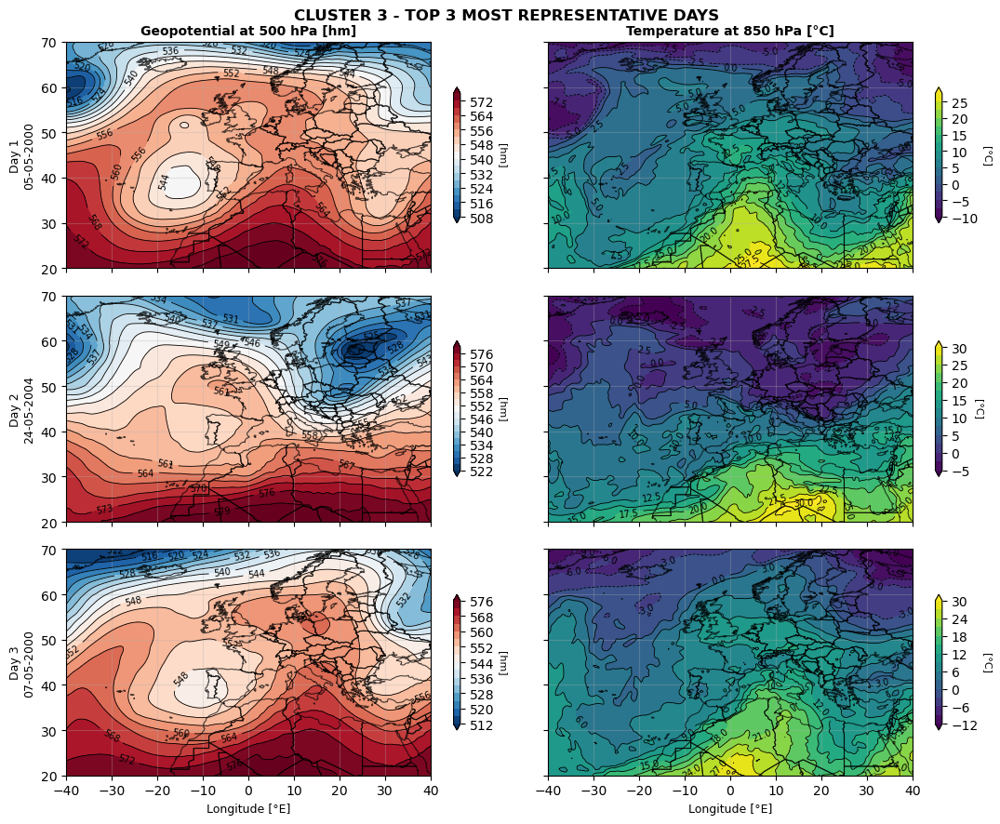

CLUSTER 4 - TOP 3 GIORNI PIÙ RAPPRESENTATIVI
  1. 20-01-2002 (Sunday) - Rappresentatività: 53.7%
  2. 19-01-2003 (Sunday) - Rappresentatività: 39.8%
  3. 19-01-2002 (Saturday) - Rappresentatività: 38.8%


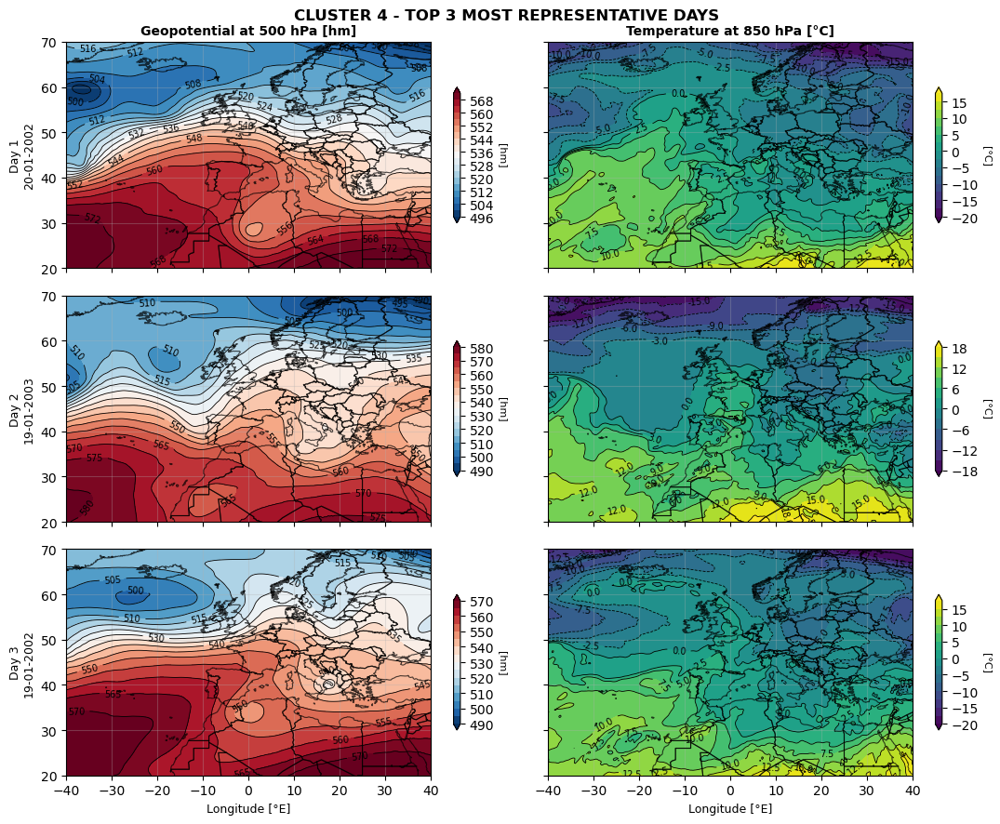

CLUSTER 5 - TOP 3 GIORNI PIÙ RAPPRESENTATIVI
  1. 30-04-2002 (Tuesday) - Rappresentatività: 38.3%
  2. 29-11-2002 (Friday) - Rappresentatività: 38.2%
  3. 15-11-2003 (Saturday) - Rappresentatività: 36.4%


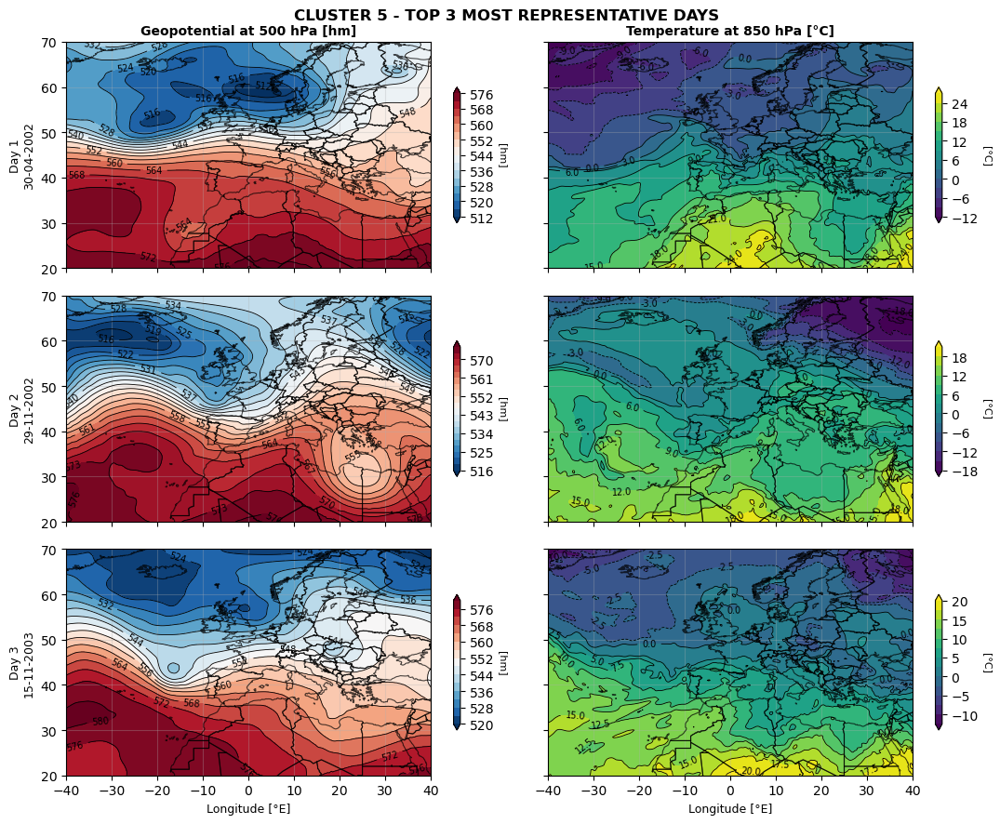

CLUSTER 6 - TOP 3 GIORNI PIÙ RAPPRESENTATIVI
  1. 16-06-2001 (Saturday) - Rappresentatività: 42.5%
  2. 06-06-2004 (Sunday) - Rappresentatività: 42.2%
  3. 17-06-2001 (Sunday) - Rappresentatività: 42.0%


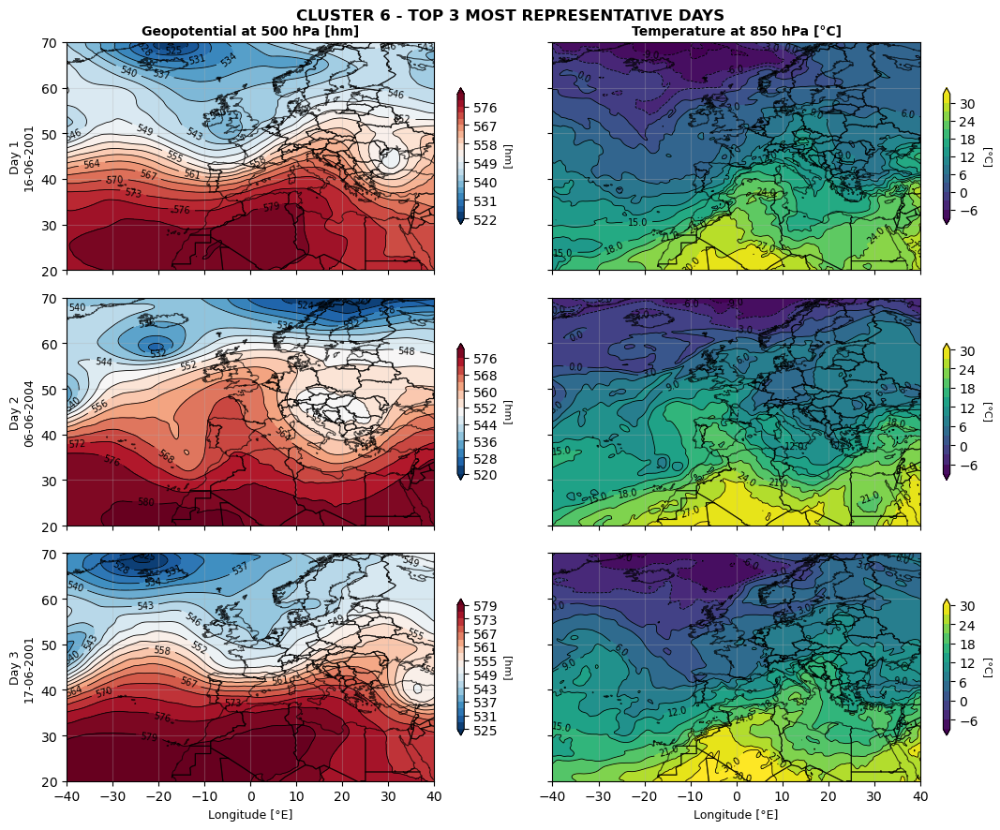

In [ ]:
def analyze_representative_days(cluster_patterns, final_labels, final_centroids, X_pca, ds_filtered):
    """
    Analizza i 3 giorni più rappresentativi di ogni cluster
    """
    representative_days = {}
    
    print("TOP 3 GIORNI PIÙ RAPPRESENTATIVI PER CLUSTER")
    
    for cluster_id in range(len(final_centroids)):
        # Trova i 3 giorni più rappresentativi
        day_indices, distances = find_most_representative_days(
            cluster_id, final_labels, final_centroids, X_pca, n_days=3)
        
        # Estrai le date
        dates = pd.to_datetime(ds_filtered.time.values)
        representative_dates = dates[day_indices]
        
        # Calcola statistiche del cluster
        cluster_mask = final_labels == cluster_id
        cluster_size = np.sum(cluster_mask)
        all_distances = np.linalg.norm(X_pca[cluster_mask] - final_centroids[cluster_id], axis=1)
        mean_distance = np.mean(all_distances)
        
        # Calcola rappresentatività per ogni giorno
        representativities = [(1 - dist/mean_distance)*100 for dist in distances]
        
        representative_days[cluster_id] = {
            'day_indices': day_indices,  
            'dates': representative_dates,  
            'distances': distances,
            'cluster_size': cluster_size,
            'mean_distance_in_cluster': mean_distance,
            'representativities': representativities
        }
        
        print(f"\nCluster {cluster_id} ({cluster_size} giorni):")
        for i, (date, dist, repr_val) in enumerate(zip(representative_dates, distances, representativities)):
            print(f"  {i+1}. {date.strftime('%Y-%m-%d')} - Distanza: {dist:.3f} - Rappresentatività: {repr_val:.1f}%")
    
    return representative_days

def plot_real_meteorological_maps(representative_days, ds_filtered, sf=None):
    """
    Visualizza le mappe meteorologiche dei 3 giorni reali più rappresentativi per ogni cluster
    """
    for cluster_id, day_info in representative_days.items():
        day_indices = day_info['day_indices']  
        dates = day_info['dates']  
        distances = day_info['distances']
        representativities = day_info['representativities']
        
        print(f"CLUSTER {cluster_id} - TOP 3 GIORNI PIÙ RAPPRESENTATIVI")
        for i, (date, repr_val) in enumerate(zip(dates, representativities)):
            print(f"  {i+1}. {date.strftime('%d-%m-%Y (%A)')} - Rappresentatività: {repr_val:.1f}%")

        # Crea una figura con 3 righe (giorni) e 2 colonne (z, t)
        fig, axes = plt.subplots(3, 2, figsize=(12, 10))
        
        for day_idx, (day_index, date, distance, representativity) in enumerate(
            zip(day_indices, dates, distances, representativities)): 
            
            # Estrai i dati per quel giorno
            if 'z' in ds_filtered.data_vars:
                z_data = ds_filtered['z'].isel(time=day_index)
                # Gestisci dimensioni
                if 'pressure_z' in z_data.dims:
                    z_data = z_data.isel(pressure_z=0)
                
            if 't' in ds_filtered.data_vars:
                t_data = ds_filtered['t'].isel(time=day_index)
                # Gestisci dimensioni
                if 'pressure_t' in t_data.dims:
                    t_data = t_data.isel(pressure_t=0)
            
            # PLOT GEOPOTENZIALE (colonna 0)
            if 'z' in ds_filtered.data_vars:
                ax = axes[day_idx, 0]
                
                # Griglia lat/lon
                lons_grid, lats_grid = np.meshgrid(z_data.longitude, z_data.latitude)
                
                # Conversione metri → decametri
                data_dam = z_data.values / 100
                
                # Contour plot
                contour_filled = ax.contourf(lons_grid, lats_grid, data_dam, 
                                           levels=20, cmap='RdBu_r', extend='both')
                contour_lines = ax.contour(lons_grid, lats_grid, data_dam, 
                                         levels=20, colors='black', linewidths=0.6)
                ax.clabel(contour_lines, inline=True, fontsize=7, fmt='%.0f')
                
                # Confini europei
                if sf is not None:
                    add_country_boundaries(ax, sf)
                
                # Styling
                if day_idx == 0:
                    ax.set_title('Geopotential at 500 hPa [hm]', fontsize=10, fontweight='bold')
                ax.set_ylabel(f'Day {day_idx+1}\n{date.strftime("%d-%m-%Y")}', fontsize=9)
                ax.set_xlim([z_data.longitude.min(), z_data.longitude.max()])
                ax.set_ylim([z_data.latitude.min(), z_data.latitude.max()])
                ax.grid(True, alpha=0.3)
                
                # Rimuovi etichette x tranne ultima riga
                if day_idx < 2:
                    ax.set_xticklabels([])
                else:
                    ax.set_xlabel('Longitude [°E]', fontsize=9)
                
                # Colorbar solo per la prima riga
                cbar = plt.colorbar(contour_filled, ax=ax, shrink=0.6)
                cbar.set_label('[hm]', rotation=270, labelpad=10, fontsize=8)
            
            # PLOT TEMPERATURA (colonna 1)
            if 't' in ds_filtered.data_vars:
                ax = axes[day_idx, 1]
                
                # Griglia lat/lon
                lons_grid, lats_grid = np.meshgrid(t_data.longitude, t_data.latitude)
                
                # Conversione Kelvin → Celsius
                data_celsius = t_data.values - 273.15
                
                # Contour plot
                contour_filled = ax.contourf(lons_grid, lats_grid, data_celsius, 
                                           levels=15, cmap='viridis', extend='both')
                contour_lines = ax.contour(lons_grid, lats_grid, data_celsius, 
                                         levels=15, colors='black', linewidths=0.6)
                ax.clabel(contour_lines, inline=True, fontsize=7, fmt='%.1f')
                
                # Confini europei
                if sf is not None:
                    add_country_boundaries(ax, sf)
                
                # Styling
                if day_idx == 0:
                    ax.set_title('Temperature at 850 hPa [°C]', fontsize=10, fontweight='bold')
                ax.set_xlim([t_data.longitude.min(), t_data.longitude.max()])
                ax.set_ylim([t_data.latitude.min(), t_data.latitude.max()])
                ax.grid(True, alpha=0.3)
                
                # Rimuovi etichette x tranne ultima riga
                if day_idx < 2:
                    ax.set_xticklabels([])
                else:
                    ax.set_xlabel('Longitude [°E]', fontsize=9)
                
                # Rimuovi etichette y per colonna destra
                ax.set_yticklabels([])
                
                # Colorbar 
                cbar = plt.colorbar(contour_filled, ax=ax, shrink=0.6)
                cbar.set_label('[°C]', rotation=270, labelpad=10, fontsize=8)
        
        # Titolo generale
        fig.suptitle(f'CLUSTER {cluster_id} - TOP 3 MOST REPRESENTATIVE DAYS', 
                    fontsize=12, fontweight='bold', y=0.98)
        
        plt.tight_layout()
        plt.subplots_adjust(top=0.94)
        plt.show()

# 🚀 ESECUZIONE CORRETTA
print("🔍 ANALISI DEI TOP 3 GIORNI PIÙ RAPPRESENTATIVI")
representative_days = analyze_representative_days(cluster_patterns, final_labels, final_centroids, X_pca, ds_filtered)

print("\n📊 VISUALIZZAZIONE MAPPE DEI GIORNI RAPPRESENTATIVI")
plot_real_meteorological_maps(representative_days, ds_filtered, sf)

_Cose da fare_  
1. Per ogni cluster, prpvo a calcolare:
- Pattern meteorologico medio (ricostruito dai centroidi PCA)
- Stagionalità (quando si verificano questi pattern)
- Persistenza (durata media degli episodi)
- Transizioni tra cluster

Regime Anticiclonico Atlantico: alta pressione dall'Atlantico  
Regime Depressionario: basse pressioni, perturbazioni  
Blocking Europeo: alta pressione stabile sull'Europa centrale  
Regime Continentale: influenza delle masse d'aria continentali  
Pattern Mediterraneo: configurazioni tipiche del Sud Europa  
Regimi di Transizione: situazioni intermedie tra i pattern principali  

_ - _  
NAO+: Alta pressione su Azzorre, bassa su Islanda → gradiente N-S
Blocking: Alta pressione su Europa centrale → gradiente N-S
Regime Atlantico: Sistemi che scorrono da ovest → sempre con componente N-S
 
<span style="color: red;">Stagionalità: Quando si verificano i vari cluster
Persistenza: Quanto durano gli episodi
Validazione: Confronto con indici meteorologici noti (NAO, AO)

_____________________________________

__________________________

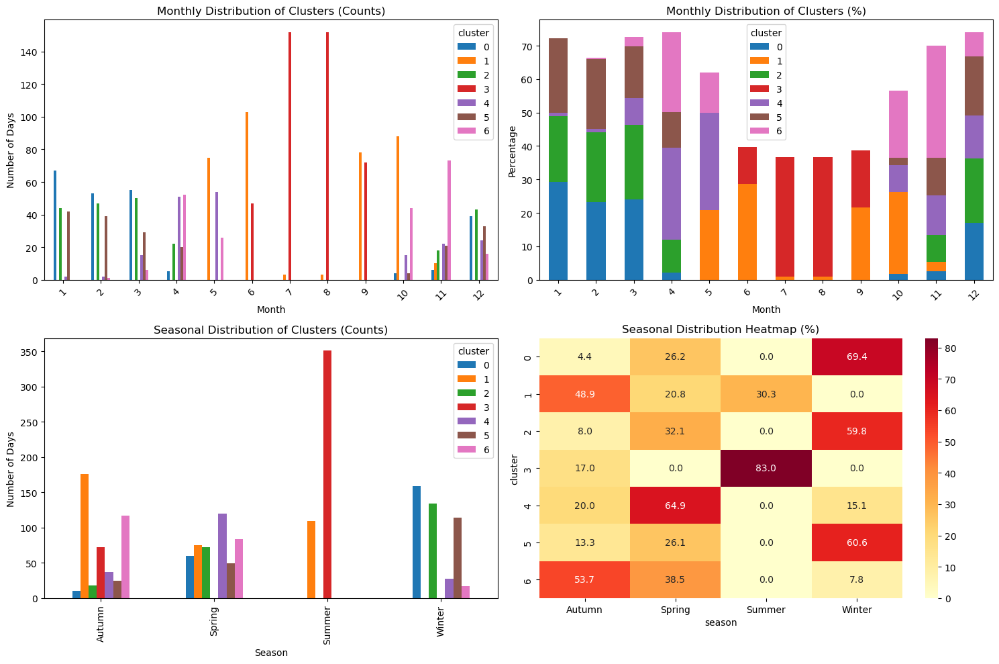

Distribuzione stagionale dei cluster:
season   Autumn  Spring  Summer  Winter
cluster                                
0            10      60       0     159
1           176      75     109       0
2            18      72       0     134
3            72       0     351       0
4            37     120       0      28
5            25      49       0     114
6           117      84       0      17


In [ ]:
# vedere se serve
# =============================================================================
# 3. ANALISI STAGIONALE
# =============================================================================

def analyze_seasonality(final_labels, ds_filtered):
    """
    Analizza la distribuzione stagionale dei cluster
    """
    # Crea array delle date
    dates = pd.to_datetime(ds_filtered.time.values)
    
    # Aggiungi informazioni temporali
    df_temporal = pd.DataFrame({
        'date': dates,
        'cluster': final_labels,
        'month': dates.month,
        'season': dates.month.map({12: 'Winter', 1: 'Winter', 2: 'Winter',
                                  3: 'Spring', 4: 'Spring', 5: 'Spring',
                                  6: 'Summer', 7: 'Summer', 8: 'Summer',
                                  9: 'Autumn', 10: 'Autumn', 11: 'Autumn'}),
        'year': dates.year
    })
    
    # Analisi per mese
    monthly_counts = df_temporal.groupby(['cluster', 'month']).size().unstack(fill_value=0)
    monthly_percentages = monthly_counts.div(monthly_counts.sum(axis=1), axis=0) * 100
    
    # Analisi per stagione
    seasonal_counts = df_temporal.groupby(['cluster', 'season']).size().unstack(fill_value=0)
    seasonal_percentages = seasonal_counts.div(seasonal_counts.sum(axis=1), axis=0) * 100
    
    # Visualizzazione
    fig, axes = plt.subplots(2, 2, figsize=(15, 10))
    
    # Plot 1: Distribuzione mensile (conteggi)
    monthly_counts.T.plot(kind='bar', ax=axes[0,0], rot=45)
    axes[0,0].set_title('Monthly Distribution of Clusters (Counts)')
    axes[0,0].set_xlabel('Month')
    axes[0,0].set_ylabel('Number of Days')
    
    # Plot 2: Distribuzione mensile (percentuali)
    monthly_percentages.T.plot(kind='bar', ax=axes[0,1], rot=45, stacked=True)
    axes[0,1].set_title('Monthly Distribution of Clusters (%)')
    axes[0,1].set_xlabel('Month')
    axes[0,1].set_ylabel('Percentage')
    
    # Plot 3: Distribuzione stagionale (conteggi)
    seasonal_counts.T.plot(kind='bar', ax=axes[1,0])
    axes[1,0].set_title('Seasonal Distribution of Clusters (Counts)')
    axes[1,0].set_xlabel('Season')
    axes[1,0].set_ylabel('Number of Days')
    
    # Plot 4: Heatmap stagionale
    import seaborn as sns
    sns.heatmap(seasonal_percentages, annot=True, fmt='.1f', 
                cmap='YlOrRd', ax=axes[1,1])
    axes[1,1].set_title('Seasonal Distribution Heatmap (%)')
    
    plt.tight_layout()
    plt.show()
    
    return df_temporal, monthly_counts, seasonal_counts

# Esegui analisi stagionale
df_temporal, monthly_counts, seasonal_counts = analyze_seasonality(final_labels, ds_filtered)

print("Distribuzione stagionale dei cluster:")
print(seasonal_counts)


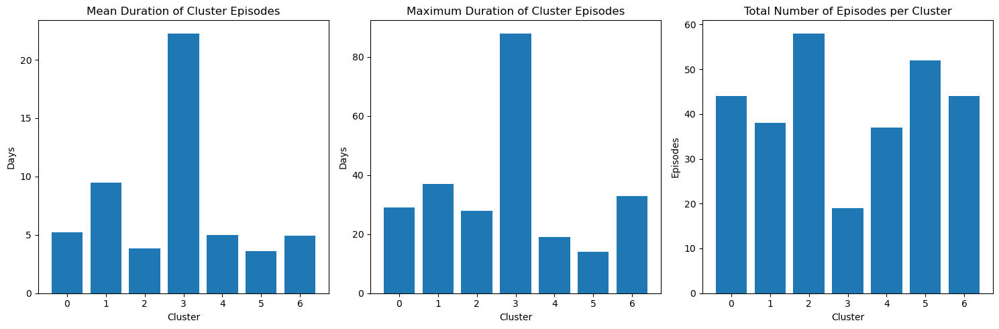

Statistiche di persistenza:
Cluster 0: Mean=5.2d, Max=29d, Episodes=44
Cluster 1: Mean=9.5d, Max=37d, Episodes=38
Cluster 2: Mean=3.9d, Max=28d, Episodes=58
Cluster 3: Mean=22.3d, Max=88d, Episodes=19
Cluster 4: Mean=5.0d, Max=19d, Episodes=37
Cluster 5: Mean=3.6d, Max=14d, Episodes=52
Cluster 6: Mean=5.0d, Max=33d, Episodes=44


In [ ]:
# vedere se serve
# =============================================================================
# 4. ANALISI DI PERSISTENZA
# =============================================================================

def analyze_persistence(final_labels):
    """
    Analizza la persistenza dei cluster (durata delle sequenze consecutive)
    """
    # Trova sequenze consecutive
    def find_runs(sequence):
        """Trova sequenze consecutive dello stesso valore"""
        runs = []
        current_value = sequence[0]
        current_length = 1
        
        for i in range(1, len(sequence)):
            if sequence[i] == current_value:
                current_length += 1
            else:
                runs.append((current_value, current_length))
                current_value = sequence[i]
                current_length = 1
        
        runs.append((current_value, current_length))
        return runs
    
    runs = find_runs(final_labels)
    
    # Analizza per cluster
    persistence_stats = {}
    
    for cluster_id in range(k_final):
        cluster_runs = [length for value, length in runs if value == cluster_id]
        
        if cluster_runs:
            persistence_stats[cluster_id] = {
                'mean_duration': np.mean(cluster_runs),
                'median_duration': np.median(cluster_runs),
                'max_duration': np.max(cluster_runs),
                'min_duration': np.min(cluster_runs),
                'std_duration': np.std(cluster_runs),
                'total_episodes': len(cluster_runs),
                'total_days': sum(cluster_runs)
            }
        else:
            persistence_stats[cluster_id] = {
                'mean_duration': 0, 'median_duration': 0, 'max_duration': 0,
                'min_duration': 0, 'std_duration': 0, 'total_episodes': 0,
                'total_days': 0
            }
    
    # Visualizzazione
    clusters = list(persistence_stats.keys())
    mean_durations = [persistence_stats[c]['mean_duration'] for c in clusters]
    max_durations = [persistence_stats[c]['max_duration'] for c in clusters]
    total_episodes = [persistence_stats[c]['total_episodes'] for c in clusters]
    
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    
    # Plot 1: Durata media
    axes[0].bar(clusters, mean_durations)
    axes[0].set_title('Mean Duration of Cluster Episodes')
    axes[0].set_xlabel('Cluster')
    axes[0].set_ylabel('Days')
    
    # Plot 2: Durata massima
    axes[1].bar(clusters, max_durations)
    axes[1].set_title('Maximum Duration of Cluster Episodes')
    axes[1].set_xlabel('Cluster')
    axes[1].set_ylabel('Days')
    
    # Plot 3: Numero di episodi
    axes[2].bar(clusters, total_episodes)
    axes[2].set_title('Total Number of Episodes per Cluster')
    axes[2].set_xlabel('Cluster')
    axes[2].set_ylabel('Episodes')
    
    plt.tight_layout()
    plt.show()
    
    return persistence_stats, runs

# Esegui analisi di persistenza
persistence_stats, runs = analyze_persistence(final_labels)

print("Statistiche di persistenza:")
for cluster_id, stats in persistence_stats.items():
    print(f"Cluster {cluster_id}: "
          f"Mean={stats['mean_duration']:.1f}d, "
          f"Max={stats['max_duration']}d, "
          f"Episodes={stats['total_episodes']}")

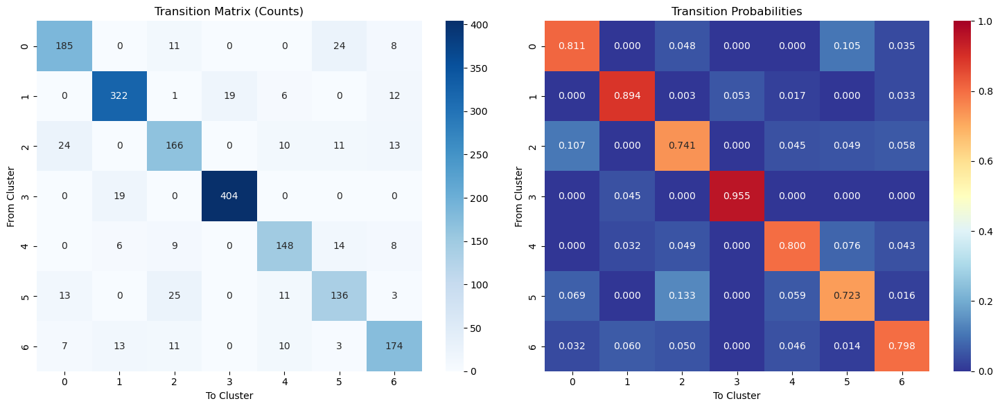


Transizioni più frequenti:
1. 5 → 2: 25 times (0.133)
2. 0 → 5: 24 times (0.105)
3. 2 → 0: 24 times (0.107)
4. 1 → 3: 19 times (0.053)
5. 3 → 1: 19 times (0.045)
6. 4 → 5: 14 times (0.076)
7. 2 → 6: 13 times (0.058)
8. 5 → 0: 13 times (0.069)
9. 6 → 1: 13 times (0.060)
10. 1 → 6: 12 times (0.033)

Stabilità dei cluster (probabilità di persistenza):
Cluster 0: 0.811
Cluster 1: 0.894
Cluster 2: 0.741
Cluster 3: 0.955
Cluster 4: 0.800
Cluster 5: 0.723
Cluster 6: 0.798

SUMMARY REPORT - CLUSTER ANALYSIS

Total clusters: 7
Total days analyzed: 1827
Period: 2000-01-01 to 2004-12-31

Cluster distribution:
  Cluster 0:  229 days ( 12.5%)
  Cluster 1:  360 days ( 19.7%)
  Cluster 2:  224 days ( 12.3%)
  Cluster 3:  423 days ( 23.2%)
  Cluster 4:  185 days ( 10.1%)
  Cluster 5:  188 days ( 10.3%)
  Cluster 6:  218 days ( 11.9%)

Most stable clusters (highest persistence probability):
  1. Cluster 3: 0.955
  2. Cluster 1: 0.894
  3. Cluster 0: 0.811

Most persistent clusters (longest average epi

In [ ]:
# vedere se serve
# =============================================================================
# 5. ANALISI DELLE TRANSIZIONI
# =============================================================================

def analyze_transitions(final_labels, k_final):
    """
    Analizza le transizioni tra cluster
    """
    # Crea matrice di transizione
    transition_matrix = np.zeros((k_final, k_final))
    
    for i in range(len(final_labels) - 1):
        current_cluster = final_labels[i]
        next_cluster = final_labels[i + 1]
        transition_matrix[current_cluster, next_cluster] += 1
    
    # Normalizza per righe (probabilità di transizione)
    transition_probabilities = transition_matrix.copy()
    for i in range(k_final):
        row_sum = transition_matrix[i, :].sum()
        if row_sum > 0:
            transition_probabilities[i, :] = transition_matrix[i, :] / row_sum
    
    # Visualizzazione
    fig, axes = plt.subplots(1, 2, figsize=(15, 6))
    
    # Plot 1: Matrice di transizione (conteggi)
    import seaborn as sns
    sns.heatmap(transition_matrix, annot=True, fmt='.0f', 
                cmap='Blues', ax=axes[0])
    axes[0].set_title('Transition Matrix (Counts)')
    axes[0].set_xlabel('To Cluster')
    axes[0].set_ylabel('From Cluster')
    
    # Plot 2: Probabilità di transizione
    sns.heatmap(transition_probabilities, annot=True, fmt='.3f', 
                cmap='RdYlBu_r', ax=axes[1], vmin=0, vmax=1)
    axes[1].set_title('Transition Probabilities')
    axes[1].set_xlabel('To Cluster')
    axes[1].set_ylabel('From Cluster')
    
    plt.tight_layout()
    plt.show()
    
    # Analisi delle transizioni più frequenti
    print("\nTransizioni più frequenti:")
    transitions = []
    for i in range(k_final):
        for j in range(k_final):
            if i != j and transition_matrix[i, j] > 0:
                transitions.append((i, j, transition_matrix[i, j], transition_probabilities[i, j]))
    
    transitions.sort(key=lambda x: x[2], reverse=True)
    
    for i, (from_cluster, to_cluster, count, prob) in enumerate(transitions[:10]):
        print(f"{i+1}. {from_cluster} → {to_cluster}: {count:.0f} times ({prob:.3f})")
    
    # Stabilità dei cluster (probabilità di rimanere nello stesso cluster)
    print(f"\nStabilità dei cluster (probabilità di persistenza):")
    for i in range(k_final):
        stability = transition_probabilities[i, i]
        print(f"Cluster {i}: {stability:.3f}")
    
    return transition_matrix, transition_probabilities

# Esegui analisi delle transizioni
transition_matrix, transition_probabilities = analyze_transitions(final_labels, k_final)

# =============================================================================
# 6. SUMMARY REPORT
# =============================================================================

print("\n" + "="*60)
print("SUMMARY REPORT - CLUSTER ANALYSIS")
print("="*60)

print(f"\nTotal clusters: {k_final}")
print(f"Total days analyzed: {len(final_labels)}")
print(f"Period: {df_temporal['date'].min().strftime('%Y-%m-%d')} to {df_temporal['date'].max().strftime('%Y-%m-%d')}")

print(f"\nCluster distribution:")
cluster_counts = np.bincount(final_labels)
for i in range(k_final):
    percentage = cluster_counts[i] / len(final_labels) * 100
    print(f"  Cluster {i}: {cluster_counts[i]:4d} days ({percentage:5.1f}%)")

print(f"\nMost stable clusters (highest persistence probability):")
stability_ranking = [(i, transition_probabilities[i, i]) for i in range(k_final)]
stability_ranking.sort(key=lambda x: x[1], reverse=True)
for i, (cluster, stability) in enumerate(stability_ranking[:3]):
    print(f"  {i+1}. Cluster {cluster}: {stability:.3f}")

print(f"\nMost persistent clusters (longest average episodes):")
persistence_ranking = [(i, persistence_stats[i]['mean_duration']) for i in range(k_final)]
persistence_ranking.sort(key=lambda x: x[1], reverse=True)
for i, (cluster, duration) in enumerate(persistence_ranking[:3]):
    print(f"  {i+1}. Cluster {cluster}: {duration:.1f} days")

2. VALIDAZIONE METEOROLOGICA   
Mappe composite: Crea mappe medie per ogni cluster    
Eventi estremi: Quali cluster corrispondono a ondate di calore, freddo, siccità?  
Confronto con indici noti: NAO, AO, blocking patterns  

3. ANALISI TEMPORALE  
Serie temporale dei cluster: Sequenza giornaliera 2000-2004  
Persistenza: Quanto durano i regimi meteorologici?  
Transizioni: Quali sono i passaggi più comuni tra cluster?  
Trend stagionali: Pattern invernali vs estivi  

Mappe per cluster: cluster_labels[i] → quale cluster per il giorno i  
Analisi temporale: quando si verificano certi pattern  
Validazione: verificare che i cluster abbiano senso meteorologico  
Predizione: training di modelli per predire il cluster  

## 5 Altri algoritmi

<span style="color: skyblue;"> provo dbscan</span> o altri